# Assigment 1 Check Point
### Name: Bhanu Chakra Sai Tarun Reddi, 50545060


### **<span style="color:Teal">The code snippets used here are derived from my submission for the CSE 574 D Introduction to ML course, Fall 2023, titled bhanucha_charviku_Assignment_3.</span>**

# Part 1 Defining the Environment

In [1]:
# import cv2
import gym as gym
from gym import spaces
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import numpy as np
import optuna


c:\Users\Kiyo\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Environment requirements:

- Min number of states: 12
- Min number of actions: 4
- Min number of rewards: 4

### About Environment

- Theme: Squirrel world, where Acorn's are the positive rewards, hunter is the -ve reward and reaching home is the goal.

- States: {S1 = (0,0), S2 = (0,1), S3 = (0,2), S4 = (0,3), S5 = (1,0), S6 = (1,1), S7 = (1,2), S8 = (1,3), S9 = (2,0), S10 = (2,1), S11 = (2,2), S12 = (2,3), S13 = (3,0), S14 = (3,1), S15 = (3,2), S16 = (3,3)}

- Actions: {Up, Down, Right, Left}

- Rewards: {-20, -50, +50, +80}

- Objective: Reach the goal state with maximum reward



## Squirrel Maze

- Note: Portions of the code have been adapted and modified from Assignment 3 of the Introduction to ML course to suit my environment description.

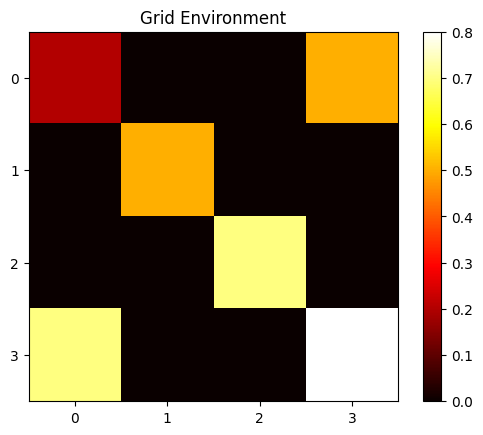

In [2]:
# start position of our squirrel
pos1 = [0, 0]  

# goal position of our squirrel
pos2 = [3, 3]  

# Acorn positions
b1 = [0, 3]
b2 = [1, 1]

# Hunter positions
r1 = [2, 2]
r2 = [3, 0]

# Creating the grid
grid = np.zeros((4, 4))
grid[tuple(pos1)] = 0.2
grid[tuple(pos2)] = 0.8
grid[tuple(b1)] = 0.5
grid[tuple(b2)] = 0.5
grid[tuple(r1)] = 0.7
grid[tuple(r2)] = 0.7

# Display the grid
plt.imshow(grid,  cmap='hot',vmin=0)
plt.colorbar()
plt.xticks(np.arange(0, 4, 1))
plt.yticks(np.arange(0, 4, 1))
plt.gca().set_xticklabels(np.arange(0, 4, 1)) 
plt.gca().set_yticklabels(np.arange(0, 4, 1)) 
plt.title('Grid Environment')
plt.show()


###  1.1 Deterministic Environment - Run 10 timestamps

In [3]:
class SquirrelPet(gym.Env):
    metadata = {'render.modes': []}

    def __init__(self, gamma=0.9, alpha=0.1, max_timestamp=10):
        self.gamma = gamma
        self.alpha = alpha

        self.obs_space = spaces.Discrete(16)
        self.action_space = spaces.Discrete(4)
        self.max_timestamp = max_timestamp
        self.timestep = 0
        self.state = np.zeros((4, 4))
        self.myagent = np.asarray([0, 0])
        self.goal_loc = np.asarray([3, 3])
        self.acorn_loc = [np.asarray([0, 3]), np.asarray([1,1])]
        self.hunter_loc = [np.asarray([2, 2]), np.asarray([3, 0])]

        self.state[tuple(self.myagent)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8
        for pos in self.acorn_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hunter_loc:
            self.state[tuple(pos)] = 0.4

        self.prev_state = np.zeros((4, 4))  
        self.prev_action = None  
        self.flag_out = 0 
        self.penalty_counter = 0

    def reset(self, **kwargs):
        self.state = np.zeros((4, 4))
        self.myagent = np.asarray([0, 0])
        self.state[tuple(self.myagent)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8

        for pos in self.acorn_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hunter_loc:
            self.state[tuple(pos)] = 0.4

        self.prev_state = np.zeros((4, 4))
        self.prev_action = None
        self.flag_out = 0 
        
        obs = self.state.flatten()
        self.timestep = 0
        info = {}
        self.penalty_counter = 0
        return obs, info

    def step(self, action):
        self.prev_state = np.copy(self.state)  
        self.prev_action = action  
        self.flag_out = 0  

        if action == 0:  
            self.myagent[0] += 1 #right
        elif action == 1:
            self.myagent[0] -= 1 #left
        elif action == 2:
            self.myagent[1] += 1 #up
        elif action == 3:
            self.myagent[1] -= 1 #down

        self.myagent = np.clip(self.myagent, 0, 3)

        # If the agent is in the same position as the previous step, choose a different action
        prev_state_positions = np.argwhere(self.prev_state == 0.2)
        if len(prev_state_positions) > 0 and np.array_equal(self.myagent, prev_state_positions[0]):
            while action == self.prev_action:
                action = self.action_space.sample()
            self.flag_out = 1

        self.state = np.zeros((4, 4))
        self.state[tuple(self.myagent)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8
        for pos in self.acorn_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hunter_loc:
            self.state[tuple(pos)] = 0.4

        obs = self.state.flatten()
        reward = self.calculate_reward()
        penalty = any(np.array_equal(self.myagent, pos) for pos in self.hunter_loc)
        if penalty:
            self.penalty_counter += 1 
        self.timestep += 1

        terminated = True if np.array_equal(self.myagent, self.goal_loc) else self.timestep >= self.max_timestamp
        truncated = True if np.any((self.myagent < 0) | (self.myagent > 3)) else False
        if truncated:
            self.flag_out = 1  

        info = {}

        return self.state.flatten(), reward, terminated, truncated, info

    def calculate_reward(self):
        prev_myagentitions = np.argwhere(self.prev_state == 0.2)
        if prev_myagentitions.size == 0:
            prev_myagentition = self.myagent
        else:
            prev_myagentition = prev_myagentitions[0]

        # Calculating distance to goal before and after the step
        prev_distance_to_goal = np.linalg.norm(self.goal_loc - prev_myagentition)
        current_distance_to_goal = np.linalg.norm(self.goal_loc - self.myagent)

        if np.array_equal(self.myagent, self.goal_loc):
            reward = 10
        elif np.array_equal(self.myagent, self.hunter_loc[0]):
            reward = -20
        elif np.array_equal(self.myagent, self.hunter_loc[1]):
            reward = -50
        elif np.array_equal(self.myagent, self.acorn_loc[0]):
            reward = 50
        elif np.array_equal(self.myagent, self.acorn_loc[1]):
            reward = 80
        elif current_distance_to_goal < prev_distance_to_goal:
            reward = 10  # Positive reward for moving closer to goal
        elif current_distance_to_goal > prev_distance_to_goal:
            reward = -10  # Negative reward for moving away to goal
        else:
            reward = -5  # Slight negative reward for no change

        return reward

    def get_penalty_count(self):
        return self.penalty_counter

    def render(self):
        fig, ax = plt.subplots()
        plt.title('Grid Environment')

        #--------------Adding the background and grod lines for clarity

        # Set the background image
        background_img_path = '/Users/Kiyo/Desktop/RL/A1/images/Cartoon_green_texture_grass.jpg'  
        background_img = plt.imread(background_img_path)
        ax.imshow(background_img, extent=[-0.5, 3.5, -0.5, 3.5])

        # Drawing grey grid lines
        ax.grid(which='major', color='grey', linestyle='-', linewidth=0.5)
        ax.set_xticks(np.arange(-0.5, 4, 1))
        ax.set_yticks(np.arange(-0.5, 4, 1))

        # Ensure the grid is behind other plot elements
        ax.set_axisbelow(True)




        #------------------------------------------------------------

        agent_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel.png')
        hunter_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/hunter.png')
        acorn_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/acorn.png')
        goal_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/house.png')
        squirrel_hunters_boom_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel_hunter.png')
        squirrel_acorn_bolt_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel_acorn.jpg')
        squirrel_goal_win_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel_house.jpg')
        squirrel_grid_cross_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel_out.jpg')

        # Plot agent
        myagent = self.myagent
        if self.flag_out:
            agent_img = squirrel_grid_cross_img
        agent_box = AnnotationBbox(OffsetImage(agent_img, zoom=0.4), myagent, frameon=False)
        ax.add_artist(agent_box)

        # Plot hunters
        for hunter_loc in self.hunter_loc:
            hunter_loc = hunter_loc
            if np.array_equal(self.myagent, hunter_loc):
                hunter_img = squirrel_hunters_boom_img
            else:
                hunter_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/hunter.png')
            hunter_box = AnnotationBbox(OffsetImage(hunter_img, zoom=0.4), hunter_loc, frameon=False)
            ax.add_artist(hunter_box)

        # Plot batteries
        for acorn_loc in self.acorn_loc:
            acorn_loc = acorn_loc
            if np.array_equal(self.myagent, acorn_loc):
                acorn_img = squirrel_acorn_bolt_img
            else:
                acorn_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/acorn.png')
            acorn_box = AnnotationBbox(OffsetImage(acorn_img, zoom=0.4), acorn_loc, frameon=False)
            ax.add_artist(acorn_box)

        # Plot goal
        goal_loc = self.goal_loc
        goal_loc = self.goal_loc
        if np.array_equal(self.myagent, goal_loc):
            goal_img = squirrel_goal_win_img
        else:
            goal_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/house.png')
        goal_box = AnnotationBbox(OffsetImage(goal_img, zoom=0.4), goal_loc, frameon=False)
        ax.add_artist(goal_box)

        plt.xticks(np.arange(-0.5, 4.5, 1))
        plt.yticks(np.arange(-0.5, 4.5, 1))
        plt.gca().set_xticklabels(np.arange(-0.5, 4.5, 1))
        plt.gca().set_yticklabels(np.arange(-0.5, 4.5, 1))
        plt.show()
        
    def obs_space_to_index(self, obs):
        """ Convert the agent's position to an integer index for the Q-table. """
        myagent = np.argwhere(obs.reshape(4, 4) == 0.2)
        if myagent.size == 0:
            return 0 
        return myagent[0, 0] * 4 + myagent[0, 1]
    


Step 1 - Action: 2, Reward: 10
Current State:
[[0.  0.2 0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


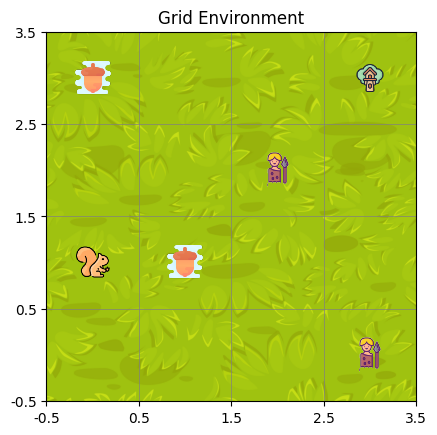

Step 2 - Action: 1, Reward: -5
Current State:
[[0.  0.2 0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


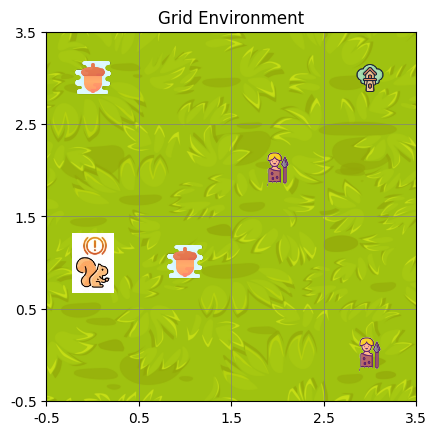

Step 3 - Action: 1, Reward: -5
Current State:
[[0.  0.2 0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


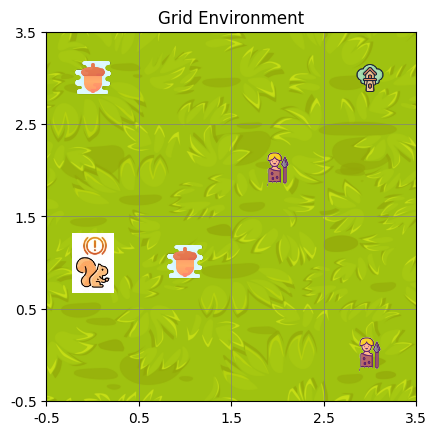

Step 4 - Action: 2, Reward: 10
Current State:
[[0.  0.  0.2 0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


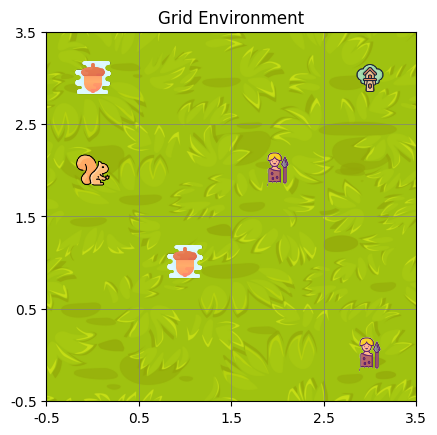

Step 5 - Action: 0, Reward: 10
Current State:
[[0.  0.  0.  0.5]
 [0.  0.5 0.2 0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


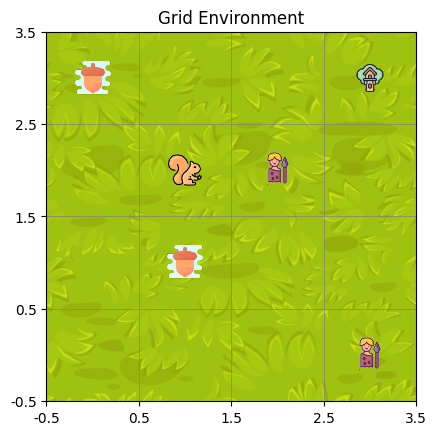

Step 6 - Action: 0, Reward: -20
Current State:
[[0.  0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


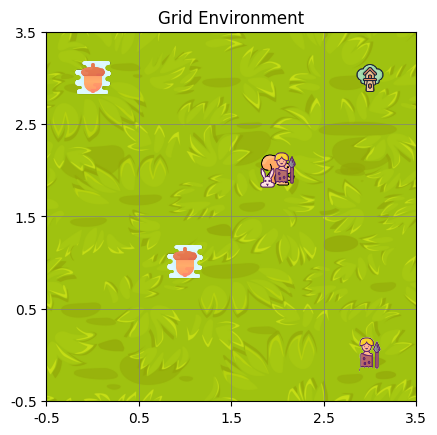

Step 7 - Action: 0, Reward: -5
Current State:
[[0.  0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.2 0.8]]


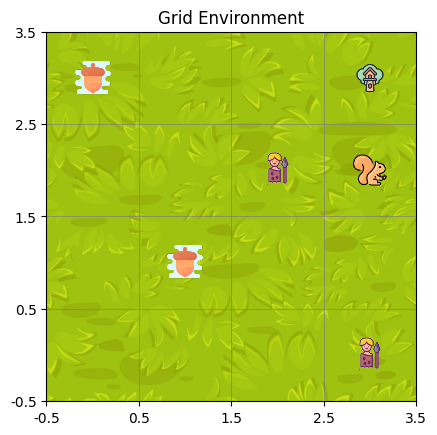

Step 8 - Action: 0, Reward: -5
Current State:
[[0.  0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.2 0.8]]


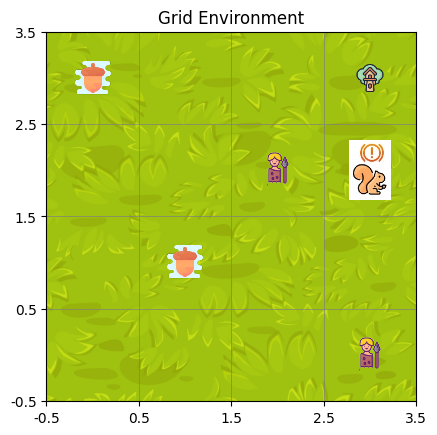

Step 9 - Action: 3, Reward: -10
Current State:
[[0.  0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.2 0.  0.8]]


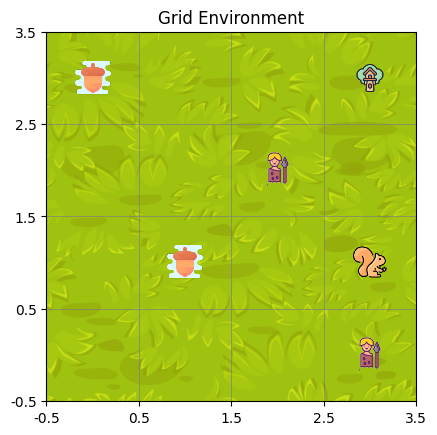

Step 10 - Action: 1, Reward: -10
Current State:
[[0.  0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.2 0.4 0. ]
 [0.4 0.  0.  0.8]]


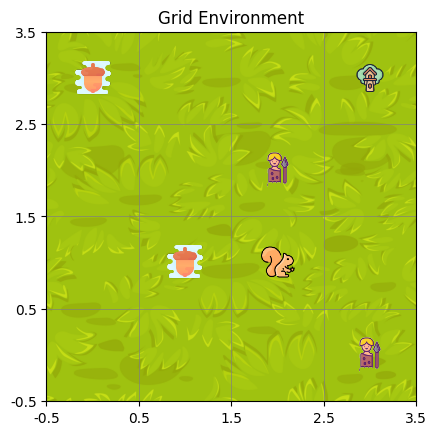

In [4]:
env = SquirrelPet()
for _ in range(10):
    action = env.action_space.sample()
    obs, reward, terminated, truncated, info = env.step(action)
    print(f"Step {_ + 1} - Action: {action}, Reward: {reward}")
    print("Current State:")
    print(env.state)
    env.render()

    # if terminated or truncated:
    #     print("Resetting environment due to termination or truncation.")
    #     obs = env.reset()
    if terminated or truncated:
        env.state = np.copy(env.prev_state) 
        env.myagent = np.argwhere(env.state == 0.2)[0]


###  1.2 Stochastic Environment - Run 10 timestamps

- He're iam bringing randomness to the the agent's movement. Instead of the agent moving deterministically based on the action chosen, with the probability that the agent moves in a different direction than intended.
- CHanges are done at the step function to acheivethe following

In [5]:
class SquirrelPet_stoch(gym.Env):
    metadata = {'render.modes': []}

    def __init__(self, gamma=0.9, alpha=0.1, max_timestamp=10):
        self.gamma = gamma
        self.alpha = alpha

        self.obs_space = spaces.Discrete(16)
        self.action_space = spaces.Discrete(4)
        self.max_timestamp = max_timestamp
        self.timestep = 0
        self.state = np.zeros((4, 4))
        self.myagent = np.asarray([0, 0])
        self.goal_loc = np.asarray([3, 3])
        self.acorn_loc = [np.asarray([0, 3]), np.asarray([1,1])]
        self.hunter_loc = [np.asarray([2, 2]), np.asarray([3, 0])]

        self.state[tuple(self.myagent)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8
        for pos in self.acorn_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hunter_loc:
            self.state[tuple(pos)] = 0.4

        self.prev_state = np.zeros((4, 4))  
        self.prev_action = None  
        self.flag_out = 0 
        self.penalty_counter = 0

    def reset(self, **kwargs):
        self.state = np.zeros((4, 4))
        self.myagent = np.asarray([0, 0])
        self.state[tuple(self.myagent)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8

        for pos in self.acorn_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hunter_loc:
            self.state[tuple(pos)] = 0.4

        self.prev_state = np.zeros((4, 4))
        self.prev_action = None
        self.flag_out = 0 
        
        obs = self.state.flatten()
        self.timestep = 0
        info = {}
        self.penalty_counter = 0
        return obs, info

# bring the randomeness to the agenet moments
    
    def step(self, action):
        self.prev_state = np.copy(self.state)  
        self.prev_action = action  
        self.flag_out = 0  

        action_probabilities = {
            0: [0.7, 0.1, 0.1, 0.1],  # Probabilities for action 0: 70% Right, 10% rest
            1: [0.1, 0.7, 0.1, 0.1],  # Probabilities for action 1: 70% Left, 10% rest
            2: [0.1, 0.1, 0.7, 0.1],  # Probabilities for action 2: 70% Up, 10% rest
            3: [0.1, 0.1, 0.1, 0.7],  # Probabilities for action 3: 70% Down, 10% rest
        }

        # Select the actual action based on the probability distribution for the intended action
        actual_action = np.random.choice([0, 1, 2, 3], p=action_probabilities[action])

        print(f"Requested Action: {action}, Chosen Action: {actual_action}")

        # Execute the actual action
        if actual_action == 0:
            self.myagent[0] += 1  # Right
        elif actual_action == 1:
            self.myagent[0] -= 1  # left
        elif actual_action == 2:
            self.myagent[1] += 1  # Up
        elif actual_action == 3:
            self.myagent[1] -= 1  # Down
            

        self.myagent = np.clip(self.myagent, 0, 3)

        # If the agent is in the same position as the previous step, choose a different action
        prev_state_positions = np.argwhere(self.prev_state == 0.2)
        if len(prev_state_positions) > 0 and np.array_equal(self.myagent, prev_state_positions[0]):
            while action == self.prev_action:
                action = self.action_space.sample()
            self.flag_out = 1

        self.state = np.zeros((4, 4))
        self.state[tuple(self.myagent)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8
        for pos in self.acorn_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hunter_loc:
            self.state[tuple(pos)] = 0.4

        obs = self.state.flatten()
        reward = self.calculate_reward()
        penalty = any(np.array_equal(self.myagent, pos) for pos in self.hunter_loc)
        if penalty:
            self.penalty_counter += 1 
        self.timestep += 1

        terminated = True if np.array_equal(self.myagent, self.goal_loc) else self.timestep >= self.max_timestamp
        truncated = True if np.any((self.myagent < 0) | (self.myagent > 3)) else False
        if truncated:
            self.flag_out = 1  

        info = {}

        return self.state.flatten(), reward, terminated, truncated, info

    def calculate_reward(self):
        prev_myagentitions = np.argwhere(self.prev_state == 0.2)
        if prev_myagentitions.size == 0:
            prev_myagentition = self.myagent
        else:
            prev_myagentition = prev_myagentitions[0]

        # Calculating distance to goal before and after the step
        prev_distance_to_goal = np.linalg.norm(self.goal_loc - prev_myagentition)
        current_distance_to_goal = np.linalg.norm(self.goal_loc - self.myagent)

        if np.array_equal(self.myagent, self.goal_loc):
            reward = 10
        elif np.array_equal(self.myagent, self.hunter_loc[0]):
            reward = -20
        elif np.array_equal(self.myagent, self.hunter_loc[1]):
            reward = -50
        elif np.array_equal(self.myagent, self.acorn_loc[0]):
            reward = 50
        elif np.array_equal(self.myagent, self.acorn_loc[1]):
            reward = 80
        elif current_distance_to_goal < prev_distance_to_goal:
            reward = 10  # Positive reward for moving closer to goal
        elif current_distance_to_goal > prev_distance_to_goal:
            reward = -10  # Negative reward for moving away to goal
        else:
            reward = -5  # Slight negative reward for no change

        return reward

    def get_penalty_count(self):
        return self.penalty_counter

    def render(self):
        fig, ax = plt.subplots()
        plt.title('Grid Environment')

        #--------------Adding the background and grod lines for clarity

        # Set the background image
        background_img_path = '/Users/Kiyo/Desktop/RL/A1/images/Cartoon_green_texture_grass.jpg'  
        background_img = plt.imread(background_img_path)
        ax.imshow(background_img, extent=[-0.5, 3.5, -0.5, 3.5])

        # Drawing grey grid lines
        ax.grid(which='major', color='grey', linestyle='-', linewidth=0.5)
        ax.set_xticks(np.arange(-0.5, 4, 1))
        ax.set_yticks(np.arange(-0.5, 4, 1))

        # Ensure the grid is behind other plot elements
        ax.set_axisbelow(True)




        #------------------------------------------------------------

        agent_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel.png')
        hunter_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/hunter.png')
        acorn_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/acorn.png')
        goal_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/house.png')
        squirrel_hunters_boom_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel_hunter.png')
        squirrel_acorn_bolt_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel_acorn.jpg')
        squirrel_goal_win_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel_house.jpg')
        squirrel_grid_cross_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/squirrel_out.jpg')

        # Plot agent
        myagent = self.myagent
        if self.flag_out:
            agent_img = squirrel_grid_cross_img
        agent_box = AnnotationBbox(OffsetImage(agent_img, zoom=0.4), myagent, frameon=False)
        ax.add_artist(agent_box)

        # Plot hunters
        for hunter_loc in self.hunter_loc:
            hunter_loc = hunter_loc
            if np.array_equal(self.myagent, hunter_loc):
                hunter_img = squirrel_hunters_boom_img
            else:
                hunter_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/hunter.png')
            hunter_box = AnnotationBbox(OffsetImage(hunter_img, zoom=0.4), hunter_loc, frameon=False)
            ax.add_artist(hunter_box)

        # Plot batteries
        for acorn_loc in self.acorn_loc:
            acorn_loc = acorn_loc
            if np.array_equal(self.myagent, acorn_loc):
                acorn_img = squirrel_acorn_bolt_img
            else:
                acorn_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/acorn.png')
            acorn_box = AnnotationBbox(OffsetImage(acorn_img, zoom=0.4), acorn_loc, frameon=False)
            ax.add_artist(acorn_box)

        # Plot goal
        goal_loc = self.goal_loc
        goal_loc = self.goal_loc
        if np.array_equal(self.myagent, goal_loc):
            goal_img = squirrel_goal_win_img
        else:
            goal_img = plt.imread('/Users/Kiyo/Desktop/RL/A1/images/house.png')
        goal_box = AnnotationBbox(OffsetImage(goal_img, zoom=0.4), goal_loc, frameon=False)
        ax.add_artist(goal_box)

        plt.xticks(np.arange(-0.5, 4.5, 1))
        plt.yticks(np.arange(-0.5, 4.5, 1))
        plt.gca().set_xticklabels(np.arange(-0.5, 4.5, 1))
        plt.gca().set_yticklabels(np.arange(-0.5, 4.5, 1))
        plt.show()
        
    def obs_space_to_index(self, obs):
        """ Convert the agent's position to an integer index for the Q-table. """
        myagent = np.argwhere(obs.reshape(4, 4) == 0.2)
        if myagent.size == 0:
            return 0 
        return myagent[0, 0] * 4 + myagent[0, 1]
    


Requested Action: 0, Chosen Action: 0
Step 1 - Action: 0, Reward: 10
Current State:
[[0.  0.  0.  0.5]
 [0.2 0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


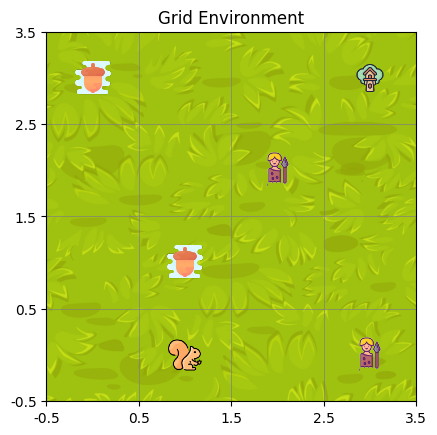

Requested Action: 2, Chosen Action: 1
Step 2 - Action: 2, Reward: -10
Current State:
[[0.2 0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


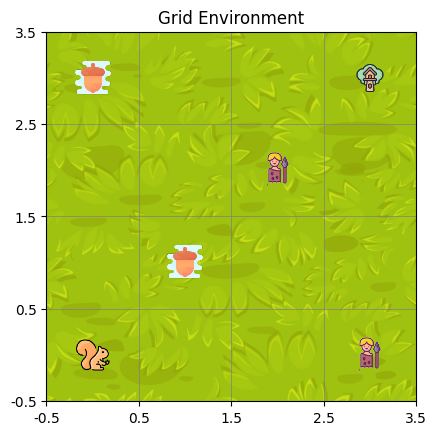

Requested Action: 1, Chosen Action: 1
Step 3 - Action: 1, Reward: -5
Current State:
[[0.2 0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


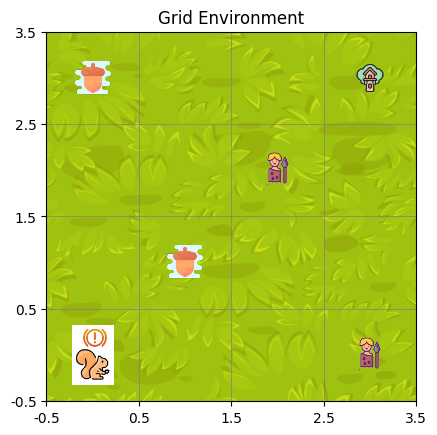

Requested Action: 1, Chosen Action: 1
Step 4 - Action: 1, Reward: -5
Current State:
[[0.2 0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


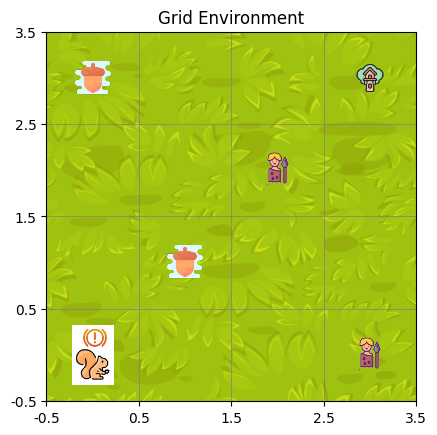

Requested Action: 2, Chosen Action: 2
Step 5 - Action: 2, Reward: 10
Current State:
[[0.  0.2 0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


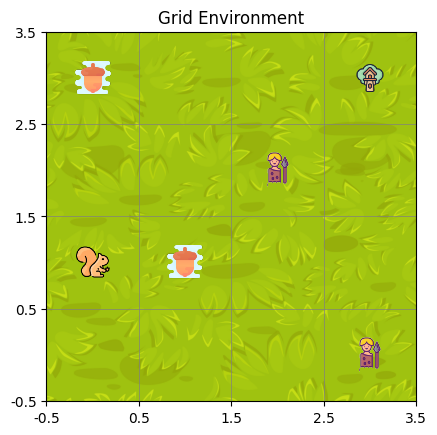

Requested Action: 0, Chosen Action: 0
Step 6 - Action: 0, Reward: 80
Current State:
[[0.  0.  0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


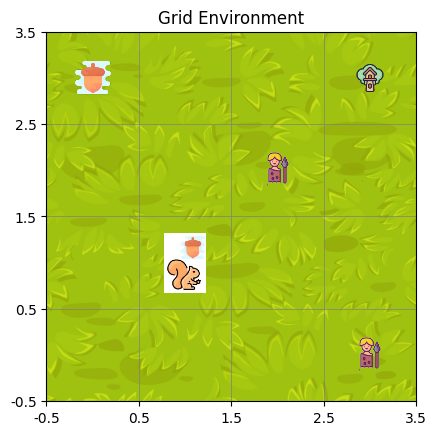

Requested Action: 1, Chosen Action: 1
Step 7 - Action: 1, Reward: -5
Current State:
[[0.  0.2 0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


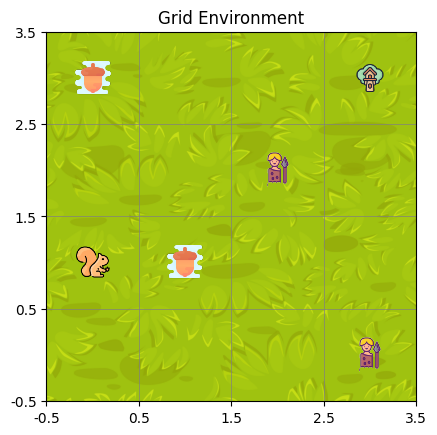

Requested Action: 1, Chosen Action: 1
Step 8 - Action: 1, Reward: -5
Current State:
[[0.  0.2 0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


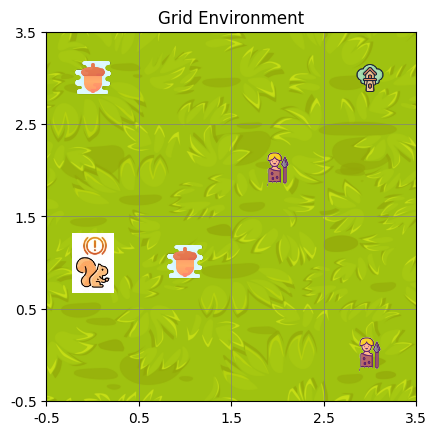

Requested Action: 2, Chosen Action: 2
Step 9 - Action: 2, Reward: 10
Current State:
[[0.  0.  0.2 0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


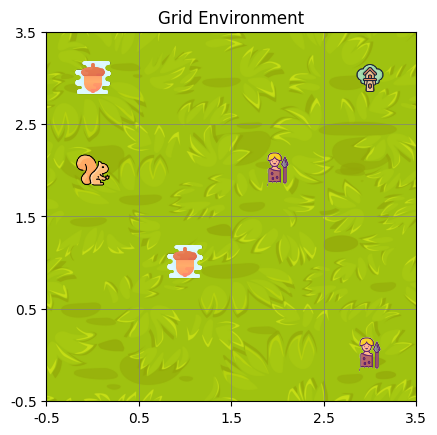

Requested Action: 0, Chosen Action: 3
Step 10 - Action: 0, Reward: -10
Current State:
[[0.  0.2 0.  0.5]
 [0.  0.5 0.  0. ]
 [0.  0.  0.4 0. ]
 [0.4 0.  0.  0.8]]


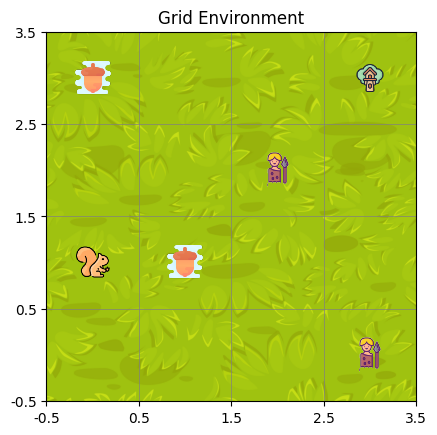

Resetting environment due to termination or truncation.


In [6]:
env = SquirrelPet_stoch()  # Ensure this is the correct class name
for _ in range(10):
    action = env.action_space.sample()
    obs, reward, terminated, truncated, info = env.step(action)
    print(f"Step {_ + 1} - Action: {action}, Reward: {reward}")
    print("Current State:")
    print(env.state)
    env.render()  # Temporarily commented out for brevity

    if terminated or truncated:
        print("Resetting environment due to termination or truncation.")
        obs = env.reset()  # Use env.reset() to correctly reset the environment


# Part 2 - Applying Tabular Methods

### Q learning on the Deterministc Environment

In [7]:
env = SquirrelPet()

epsilon = 1.0  # Initial exploration rate
epsilon_min = 0.01  # Minimum exploration rate
gamma = 0.95  # Discount factor
alpha = 0.15  # Learning rate
decay_rate = 0.995  # Epsilon decay rate per episode
total_episodes = 1000 
max_timestamp = 10
qt = np.zeros((env.obs_space.n, env.action_space.n))

rewards_epi = []
epsilon_values = []
steps_per_episode = []
penalties_per_episode = []

final_state = None
for episode in range(total_episodes):
    state, _ = env.reset()
    state_index = env.obs_space_to_index(state)
    total_rewards = 0
    total_steps = 0  
    

    while True:

        if np.random.uniform(0, 1) < epsilon:
            action = env.action_space.sample()
        else:
            action = np.argmax(qt[state_index])
    

        next_state, reward, terminated, truncated, _ = env.step(action)
        total_steps += 1 
        next_strt_idx = env.obs_space_to_index(next_state)
        


        qt[state_index, action] += alpha * (reward + gamma * np.max(qt[next_strt_idx]) - qt[state_index, action])


        state_index = next_strt_idx
        total_rewards += reward
        
        if terminated or truncated:
            break
    
    penalties_per_episode.append(env.get_penalty_count())  
    
    # Q-table for every 100 episodes
    if (episode + 1) % 100 == 0:
        print(f"Episode: {episode + 1}")
        print("Q-table:")
        print(qt)

        # average penalties
        avg_penalty = np.mean(penalties_per_episode[-100:])
        print(f"Average Penalties in Last 100 Episodes: {avg_penalty}")

    epsilon = max(epsilon_min, epsilon * decay_rate)
    epsilon_values.append(epsilon)
    rewards_epi.append(total_rewards)
    steps_per_episode.append(total_steps)

    if (episode + 1) % 100 == 0:
        average_steps = np.mean(steps_per_episode[-100:])
        print(f"Episode: {episode + 1}, Average Steps: {average_steps}")

    if episode == total_episodes - 1:
        final_state = env.state


Episode: 100
Q-table:
[[261.21072224 210.44818335 189.78890182 238.54036283]
 [274.27837149 163.76200021 142.22521201 150.54278704]
 [ 53.60390174  66.87575693 198.57737294  90.74973246]
 [  0.           0.           0.           0.        ]
 [107.68757804 163.09589835 324.08762921 232.73113264]
 [  0.           0.           0.           0.        ]
 [ 79.56440545  80.29173058  42.25816205 204.92550568]
 [  5.45743573 109.3976171   11.02996931   5.45793078]
 [115.76571291 175.23391922  98.18003386  26.41016195]
 [ 31.80530592 286.06087423 126.87389425  79.78131707]
 [  0.           0.           0.           0.        ]
 [ 78.68279391   0.           1.29493573   0.        ]
 [  0.           0.           0.           0.        ]
 [  1.75313449  39.26367458   8.30326772  76.53118417]
 [ -2.38996875  40.03030424  31.12138771  -0.83488958]
 [  0.           0.           0.           0.        ]]
Average Penalties in Last 100 Episodes: 0.54
Episode: 100, Average Steps: 9.96
Episode: 200
Q-tab

In [8]:
# import pickle

# # Assuming qt is your Q-table after training
# qt = ...  # Your trained Q-table here

# # Save the Q-table with pickle
# with open('q_table_det.pkl', 'wb') as f:
#     pickle.dump(qt, f)

# print("Q-table saved")


- Evaluation results for the Qlearning - Deterministic

- Print the initial and final q-table

In [9]:
initial_qt = np.zeros((env.obs_space.n, env.action_space.n))
print("Initial Q-table:")
print(initial_qt)

Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [10]:
print("\nTrained Q-table:")
print(qt)


Trained Q-table:
[[755.68046985 738.77036707 751.0243014  738.26886925]
 [802.90723268 680.44233739 685.2680236  651.8865724 ]
 [314.22336146 202.29621912 771.78893625 352.11472132]
 [  0.           0.           0.           0.        ]
 [401.54491784 453.51165122 799.73618402 523.83457806]
 [  0.           0.           0.           0.        ]
 [699.27546269 707.8774757  713.63571923 802.4011804 ]
 [ 80.91164114 763.65444993  61.03464592 266.25539345]
 [273.36777616 541.48395366 154.8038645  143.15450001]
 [165.75564667 798.33997557 500.56647495 337.898102  ]
 [  0.           0.           0.           0.        ]
 [712.28378908 291.7648793  123.42309541 158.61098168]
 [  0.           0.           0.           0.        ]
 [ 11.64585806 100.68806994  54.20890611 291.67487213]
 [ 33.83503922 169.49361578 144.16360569  48.33122515]
 [  0.           0.           0.           0.        ]]


- Total Reward / Episode

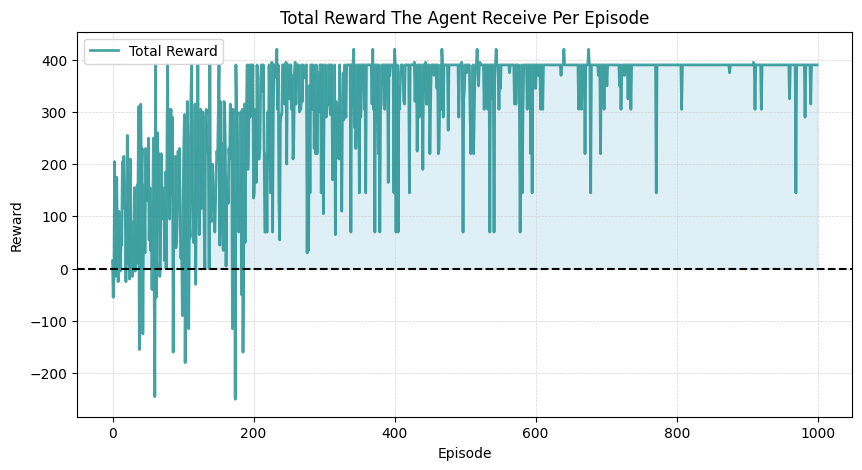

In [11]:
# total reward per episode graph
plt.figure(figsize=(10, 5))
plt.plot(rewards_epi, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Total Reward')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Total Reward The Agent Receive Per Episode')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')
plt.fill_between(range(len(rewards_epi)), rewards_epi, color="lightblue", alpha=0.4)
plt.axhline(y=0, color='black', linestyle='--')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


- Epsilon Decay

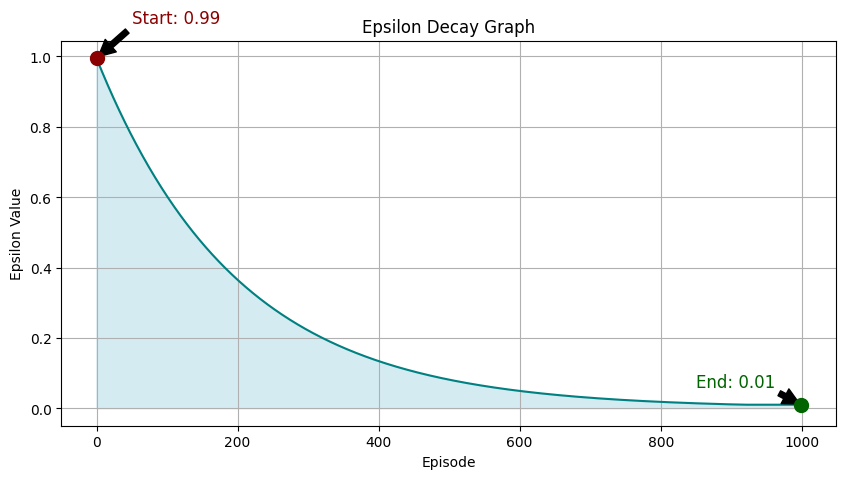

In [12]:
# epsilon decay graph
plt.figure(figsize=(10, 5))
plt.plot(epsilon_values, color='Teal', label='Decay')
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Graph')

plt.fill_between(range(len(epsilon_values)), epsilon_values, color="lightblue", alpha=0.5)

plt.scatter(0, epsilon_values[0], color='darkred', s=100, zorder=5, label='Start')
plt.scatter(len(epsilon_values)-1, epsilon_values[-1], color='darkgreen', s=100, zorder=5, label='End')

# Annotations
plt.annotate(f'Start: {epsilon_values[0]:.2f}', xy=(0, epsilon_values[0]), xytext=(50, epsilon_values[0]+0.1),
             arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkred')
plt.annotate(f'End: {epsilon_values[-1]:.2f}', xy=(len(epsilon_values)-1, epsilon_values[-1]), xytext=(len(epsilon_values)-150, epsilon_values[-1]+0.05),
             arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkgreen')



plt.grid(True)
plt.show()

-  environment for at 10 episodes, where the agent chooses only greedy actions from the learned policy. 

In [13]:
greedy_rewards = []
for _ in range(10):
    total_reward = 0
    state, _ = env.reset()
    state_index = env.obs_space_to_index(state)

    while True:
        action = np.argmax(qt[state_index])
        next_state, reward, terminated, truncated, _ = env.step(action)
        next_strt_idx = env.obs_space_to_index(next_state)
        total_reward += reward
        state_index = next_strt_idx
        if terminated or truncated:
            print(f"Episode {episode + 1} Reward: {round(total_reward, 4)}")
            break

    greedy_rewards.append(total_reward)



Episode 1000 Reward: 390
Episode 1000 Reward: 390
Episode 1000 Reward: 390
Episode 1000 Reward: 390
Episode 1000 Reward: 390
Episode 1000 Reward: 390
Episode 1000 Reward: 390
Episode 1000 Reward: 390
Episode 1000 Reward: 390
Episode 1000 Reward: 390


- Include a plot of the total reward per episode for the greedy actions above!.

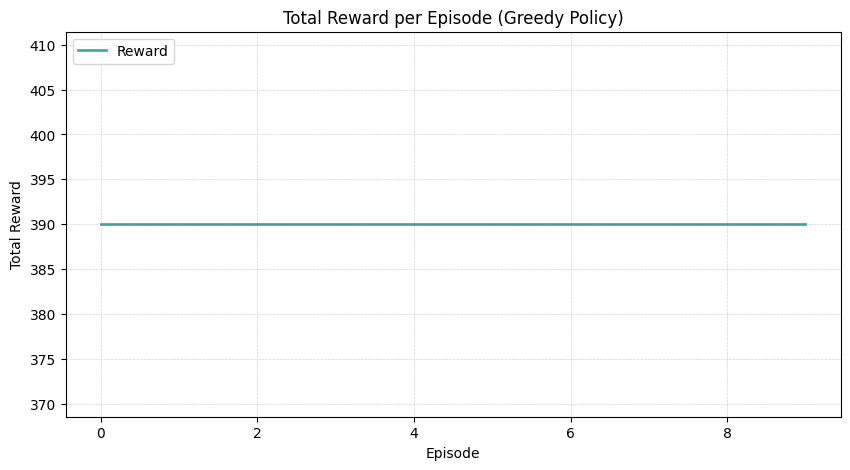

In [14]:
# total rewards for 10 episodes
plt.figure(figsize=(10, 5))
plt.plot(greedy_rewards, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Reward')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Total Reward per Episode (Greedy Policy)')

plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')

plt.legend(loc='upper left')
plt.grid(True)
plt.show()





Hyperparameter tuning. Select two hyperparameters to tune to get better results:

- Discount factor (γ)
- Epsilon decay rate
- Epsilon min/max values
- Number of episodes
- Max timesteps



In [15]:
performance_dict = {}

def training_loop(env, d , max_timestamp):
    

    epsilon = 1.0  # Initial exploration rate
    epsilon_min = 0.01  # Minimum exploration rate
    gamma = 0.95  # Discount factor
    alpha = 0.15  # Learning rate
    decay_rate = d  # Epsilon decay rate per episode
    total_episodes = 1000 
    max_timestamp = max_timestamp
    qt = np.zeros((env.obs_space.n, env.action_space.n))

    rewards_epi = []
    epsilon_values = []
    steps_per_episode = []
    penalties_per_episode = []

    final_state = None
    for episode in range(total_episodes):
        state, _ = env.reset()
        state_index = env.obs_space_to_index(state)
        total_rewards = 0
        total_steps = 0  
        

        while True:

            if np.random.uniform(0, 1) < epsilon:
                action = env.action_space.sample()
            else:
                action = np.argmax(qt[state_index])
        

            next_state, reward, terminated, truncated, _ = env.step(action)
            total_steps += 1 
            next_strt_idx = env.obs_space_to_index(next_state)
            


            qt[state_index, action] += alpha * (reward + gamma * np.max(qt[next_strt_idx]) - qt[state_index, action])


            state_index = next_strt_idx
            total_rewards += reward
            
            if terminated or truncated:
                break
        
        penalties_per_episode.append(env.get_penalty_count())  
        

        epsilon = max(epsilon_min, epsilon * decay_rate)
        epsilon_values.append(epsilon)
        rewards_epi.append(total_rewards)
        steps_per_episode.append(total_steps)


        if episode == total_episodes - 1:
            final_state = env.state

    final_reward = np.mean(rewards_epi[-100:]) 
    performance_dict[(alpha, gamma, max_timestamp)] = final_reward
    return qt, rewards_epi, epsilon_values, final_state
        


In [16]:
def evaluate_loop(env, max_timestamp, decay, qt, rewards_epi, epsilon_values, final_state):
    print(f"Max Timestamp, Decay Rate:  {max_timestamp}, {decay}")

    initial_qt = np.zeros((env.obs_space.n, env.action_space.n))
    print("Initial Q-table:")
    print(initial_qt)
    print("\nTrained Q-table:")
    print(qt)


    # total reward per episode graph
    plt.figure(figsize=(10, 5))
    plt.plot(rewards_epi, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Total Reward')
    plt.xlabel('Episode')
    plt.ylabel('Reward')
    plt.title('Total Reward The Agent Receive Per Episode')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')
    plt.fill_between(range(len(rewards_epi)), rewards_epi, color="lightblue", alpha=0.4)
    plt.axhline(y=0, color='black', linestyle='--')
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.show()



    # epsilon decay graph
    plt.figure(figsize=(10, 5))
    plt.plot(epsilon_values, color='Teal', label='Decay')
    plt.xlabel('Episode')
    plt.ylabel('Epsilon Value')
    plt.title('Epsilon Decay Graph')

    plt.fill_between(range(len(epsilon_values)), epsilon_values, color="lightblue", alpha=0.5)

    plt.scatter(0, epsilon_values[0], color='darkred', s=100, zorder=5, label='Start')
    plt.scatter(len(epsilon_values)-1, epsilon_values[-1], color='darkgreen', s=100, zorder=5, label='End')

    # Annotations
    plt.annotate(f'Start: {epsilon_values[0]:.2f}', xy=(0, epsilon_values[0]), xytext=(50, epsilon_values[0]+0.1),
                arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkred')
    plt.annotate(f'End: {epsilon_values[-1]:.2f}', xy=(len(epsilon_values)-1, epsilon_values[-1]), xytext=(len(epsilon_values)-150, epsilon_values[-1]+0.05),
                arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkgreen')
    plt.grid(True)
    plt.show()

    

    greedy_rewards = []
    for _ in range(10):
        total_reward = 0
        state, _ = env.reset()
        state_index = env.obs_space_to_index(state)

        while True:
            action = np.argmax(qt[state_index])
            next_state, reward, terminated, truncated, _ = env.step(action)
            next_strt_idx = env.obs_space_to_index(next_state)
            total_reward += reward
            state_index = next_strt_idx

            if terminated or truncated:
                print(f"Episode {episode + 1} Reward: {round(total_reward, 4)}")
                break

        greedy_rewards.append(total_reward)


        

    # total rewards for 10 episodes
    plt.figure(figsize=(10, 5))
    plt.plot(greedy_rewards, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Reward')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Reward per Episode (Greedy Policy)')

    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')

    plt.legend(loc='upper left')
    plt.grid(True)
    plt.show()




    env.state = final_state
    env.render()   

Max Timestamp, Decay Rate:  12, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 20.72991003 265.46119538 381.14904027 112.36433482]
 [450.30875163 117.43645697  70.98324625  47.05833374]
 [201.48404273   0.           0.           0.        ]
 [  0.           0.           0.           0.        ]
 [  1.5         -1.16035125 179.39086872   0.        ]
 [  0.           0.           0.           0.        ]
 [ 88.21384422   0.         355.69918498 201.08718927]
 [363.79559616 113.99088372  49.21443084  88.20338782]
 [ -6.7495331    0.           0.           0.        ]
 [  4.87099786   0.          -4.81928744   0.        ]
 [  0.           0.           0.           0.        ]
 [372.21248066  91.3136893   -0.75       125.63584337]
 [  0.           0.         

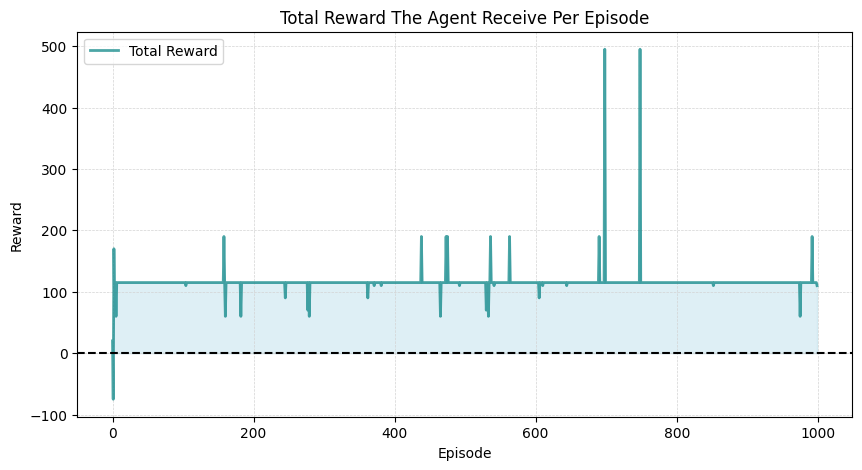

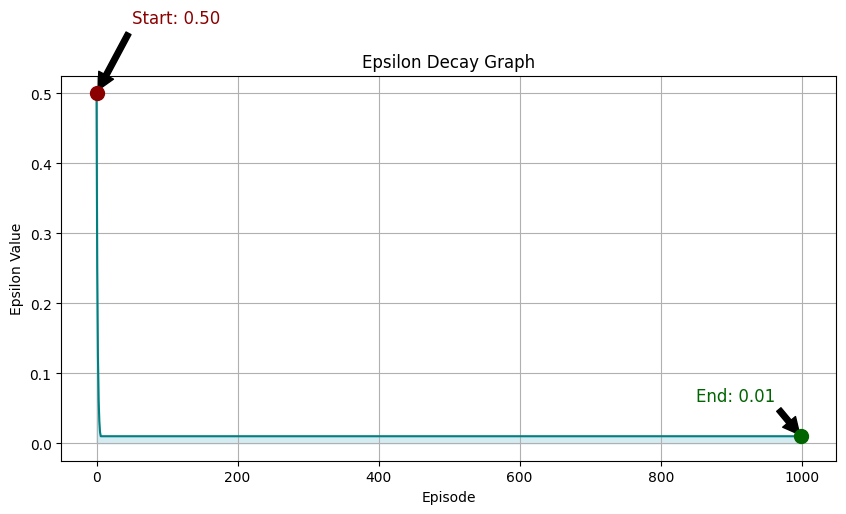

Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115


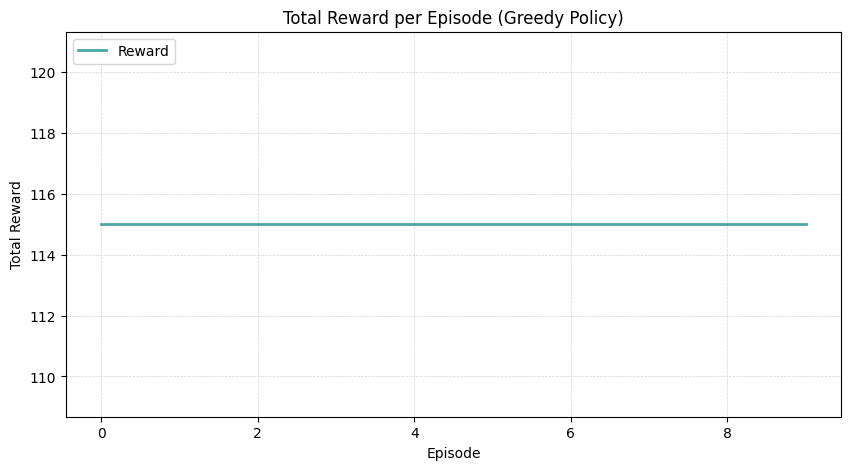

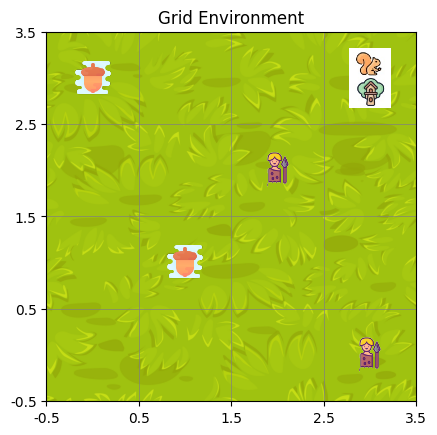

Max Timestamp, Decay Rate:  12, 0.75
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 3.75434456e+02  1.03751871e+02  1.09919602e+01  9.09649132e+01]
 [ 2.08523210e+02  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 2.05207484e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 2.04924725e+01  1.33210469e+02  4.44431987e+02  4.83648193e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-2.55905826e+00 -1.50000000e+00  5.89228734e+00  0.00000000e+00]
 [ 0.00000000e+00  1.44976292e+01 -7.50000000e-01 -1.75366155e+00]
 [ 0.00000000e+00  0.00000000e+00  1.74253882e+02  0.00000000e+00]
 [ 3.49835468e+02  1.64460217e+02  1.17636818e+02  3.06391335e+01]
 [ 0.00000000e+00

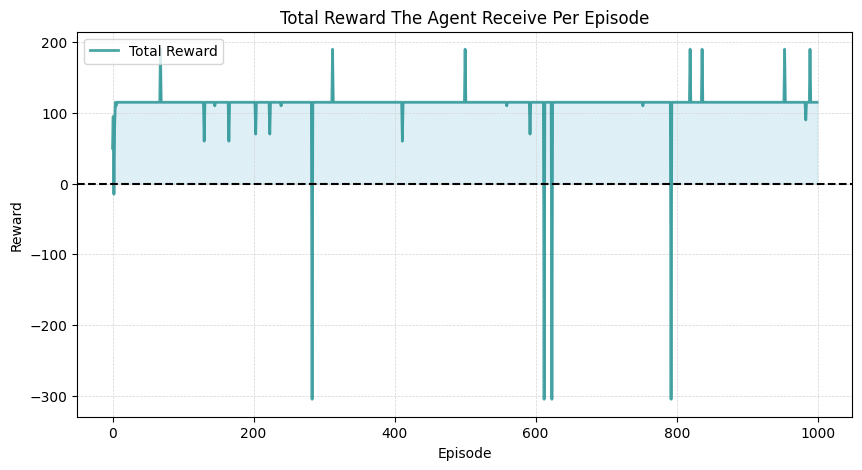

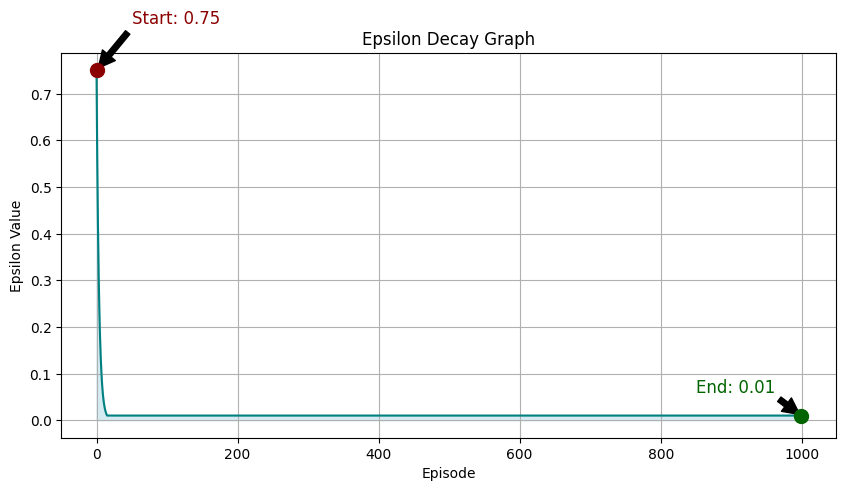

Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115


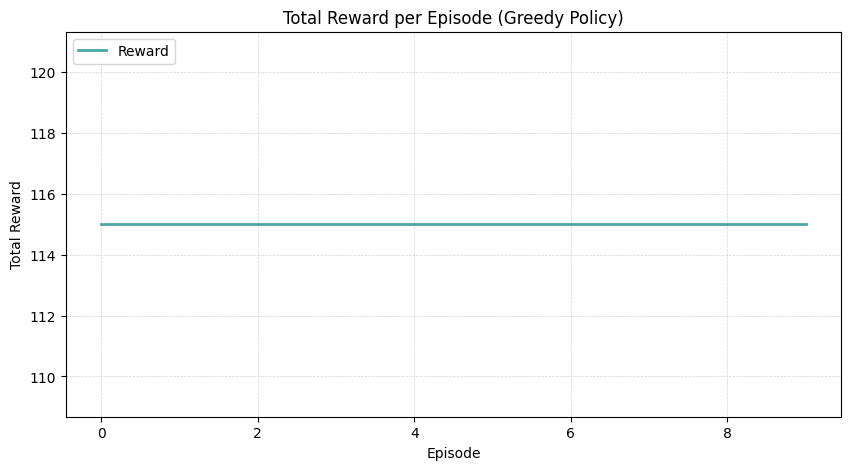

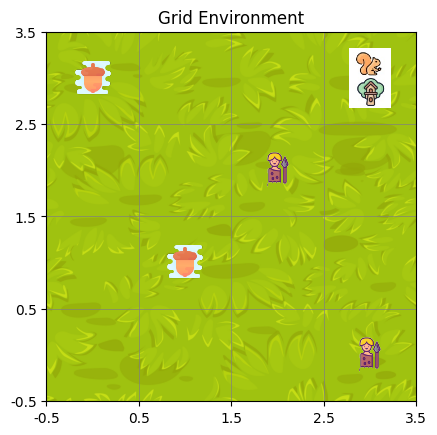

Max Timestamp, Decay Rate:  12, 0.995
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[736.8812531  741.09766692 754.15522698 734.28993913]
 [798.74344334 720.7819662  681.80973036 689.26206417]
 [514.41593594 247.06847512 463.26789505 744.768057  ]
 [  0.           0.           0.           0.        ]
 [357.14041124 540.62211415 794.10006888 474.96970181]
 [  0.           0.           0.           0.        ]
 [693.86244517 693.30290138 729.81179167 797.07655028]
 [243.41092755 762.95287649 337.51850596 243.09730382]
 [173.53713824 251.97917945 562.13732421 151.95130834]
 [275.79304854 793.26817676 533.84920453 324.68589778]
 [  0.           0.           0.           0.        ]
 [710.66694951 172.53023764 266.56104289 224.10778121]
 [  0.           0.       

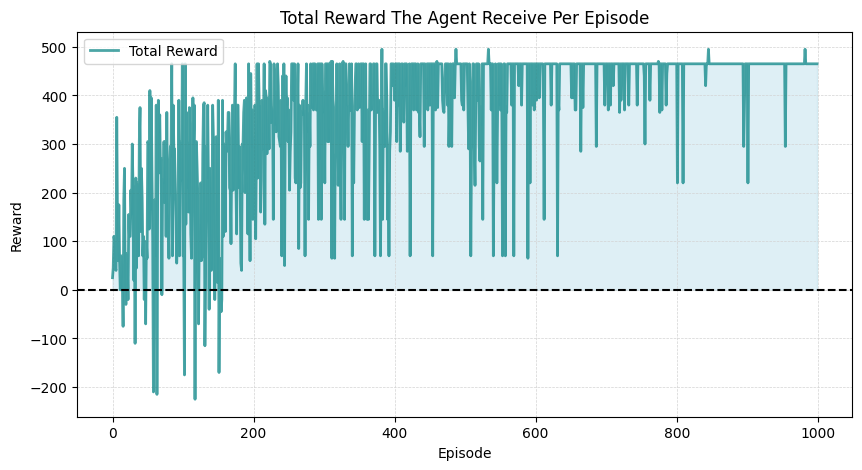

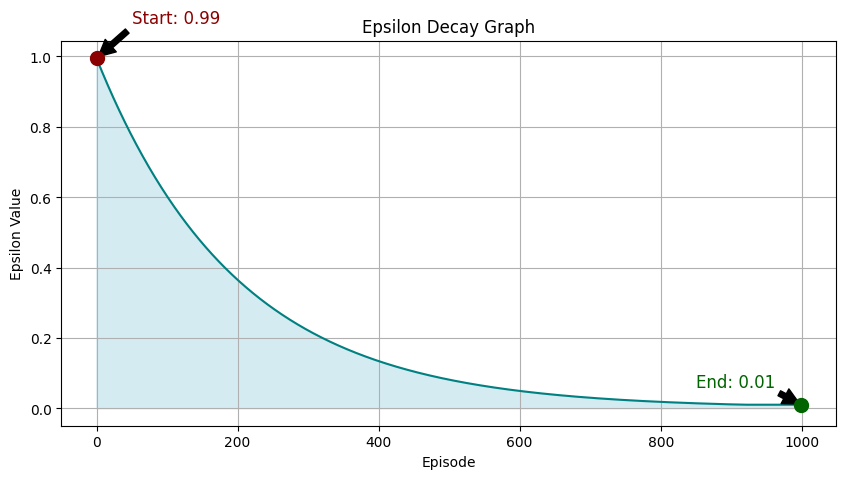

Episode 1000 Reward: 465
Episode 1000 Reward: 465
Episode 1000 Reward: 465
Episode 1000 Reward: 465
Episode 1000 Reward: 465
Episode 1000 Reward: 465
Episode 1000 Reward: 465
Episode 1000 Reward: 465
Episode 1000 Reward: 465
Episode 1000 Reward: 465


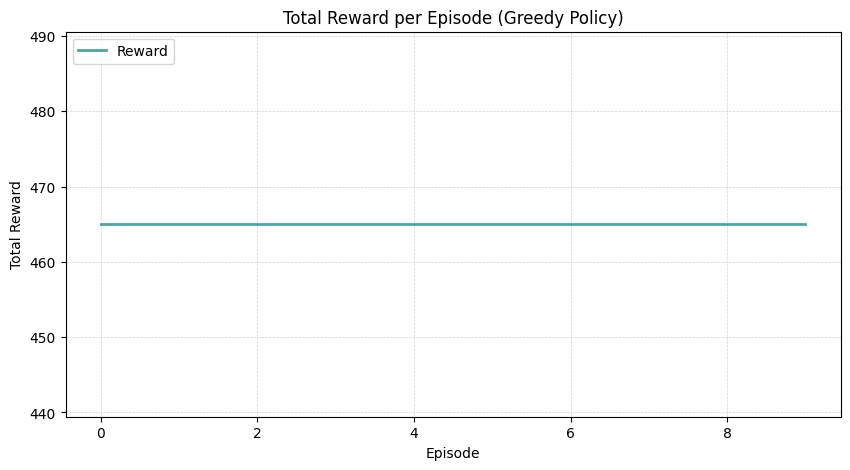

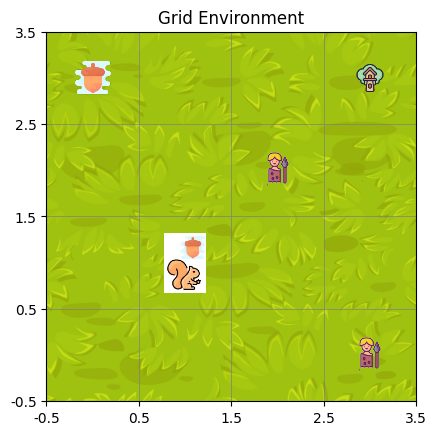

Max Timestamp, Decay Rate:  15, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[377.71290413  98.56296264  30.9435204  146.13750058]
 [199.58908231  -0.75         0.          -1.28625   ]
 [  1.5          0.           0.           0.        ]
 [  0.           0.           0.           0.        ]
 [ 18.19986717  89.01031894 446.83568094  -1.3875    ]
 [  0.           0.           0.           0.        ]
 [ -2.54821266  -1.5          1.5        118.74849231]
 [  1.7781297    0.           0.           0.        ]
 [  0.          -1.28625    130.42789436   0.        ]
 [352.13839425 112.45331991 100.77674526   4.47610729]
 [  0.           0.           0.           0.        ]
 [ 46.48164521   0.           0.           0.        ]
 [  0.           0.         

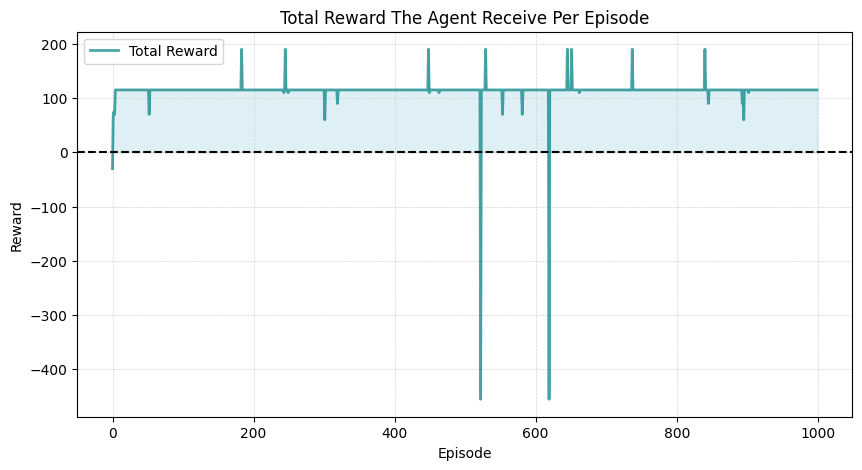

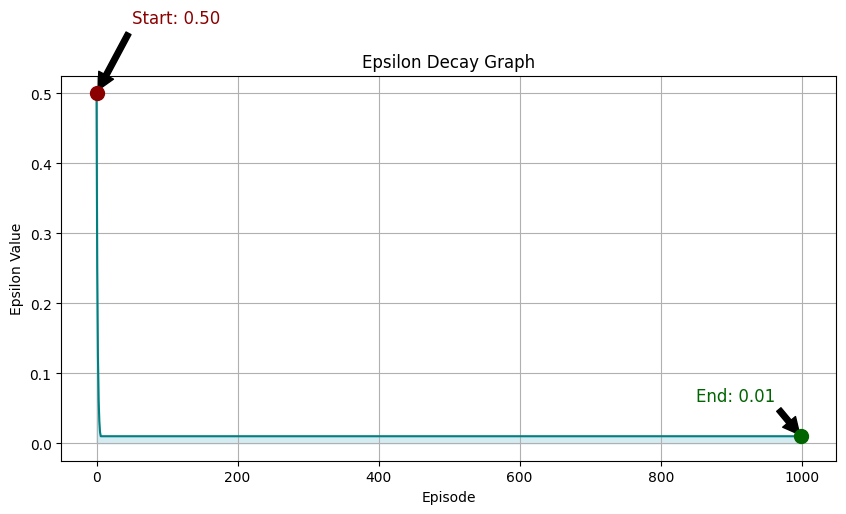

Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115


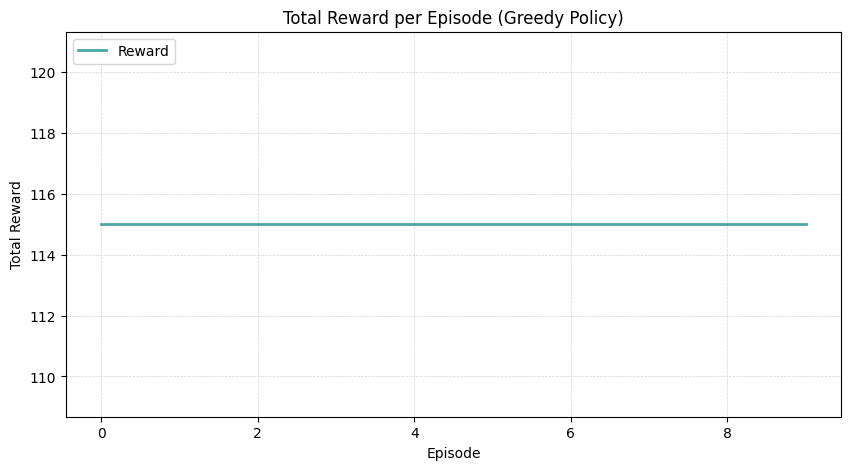

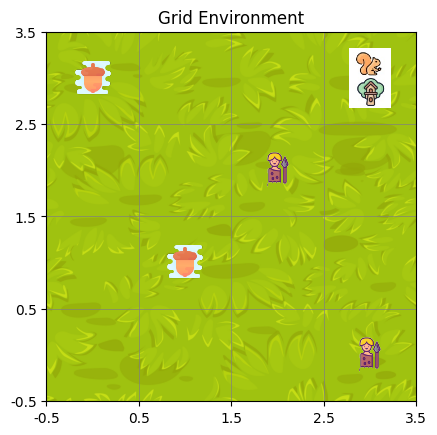

Max Timestamp, Decay Rate:  15, 0.75
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 6.97412813e+02  5.77966189e+02  1.80337956e+02  6.07336231e+02]
 [ 7.53857131e+02  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.50000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.42753823e+02  1.20054922e+02  7.36932680e+02 -1.38750000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-1.41863153e-01 -1.50000000e+00  3.24700276e+02  0.00000000e+00]
 [ 4.92758803e+02  0.00000000e+00  0.00000000e+00  2.06384333e+01]
 [-6.95012812e+00  6.11309093e+02  2.07868722e+02  0.00000000e+00]
 [ 3.53836683e+02  7.40513849e+02  6.07932928e+02  3.10261011e+02]
 [ 0.00000000e+00

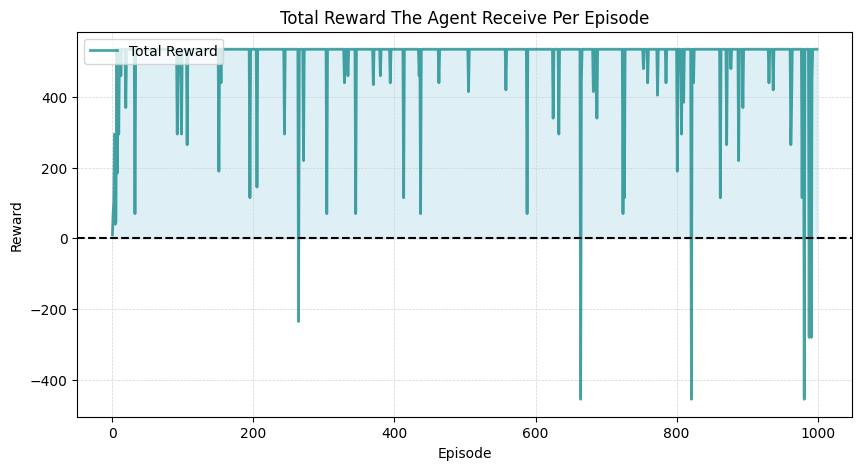

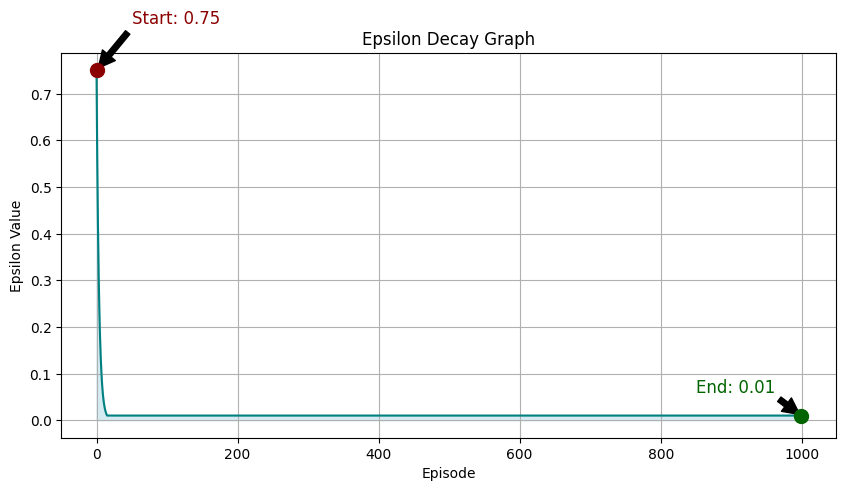

Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535


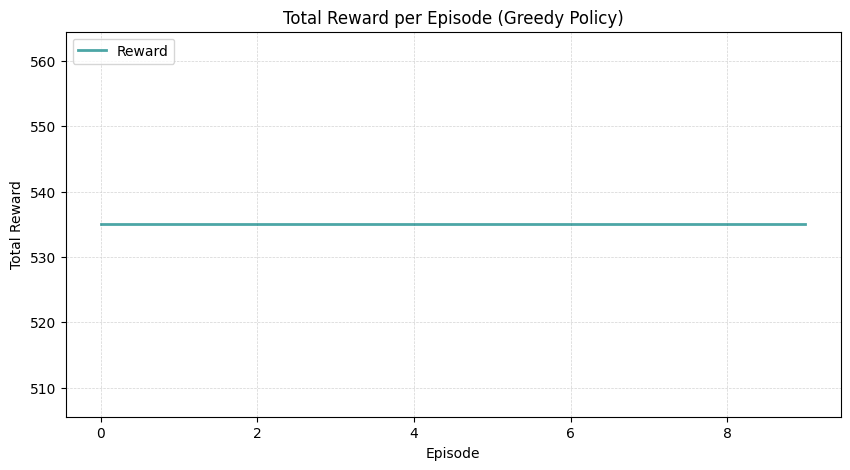

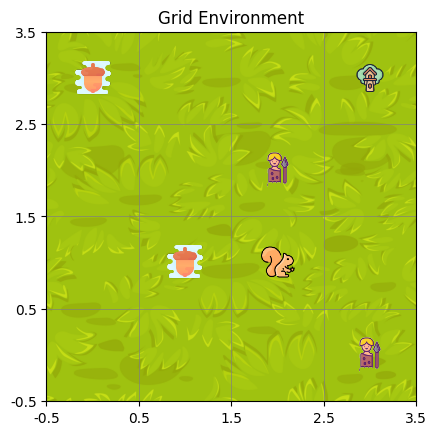

Max Timestamp, Decay Rate:  15, 0.995
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[733.53471843 733.98394971 748.38232365 741.19453681]
 [793.46506288 744.64291668 733.07389907 701.12483591]
 [656.61486883 521.56870516 766.56646369 609.84911036]
 [  0.           0.           0.           0.        ]
 [511.89539483 604.01550333 793.1496316  611.63200479]
 [  0.           0.           0.           0.        ]
 [693.00198762 724.627091   741.4537786  791.74017173]
 [398.05466288 765.27729107 424.52675665 508.26558037]
 [184.82270253 714.59598833 374.44172428 179.40175128]
 [520.80105263 793.04175528 643.48691872 521.69979944]
 [  0.           0.           0.           0.        ]
 [714.13553777 239.19169648 289.73020858 361.12804489]
 [  0.           0.       

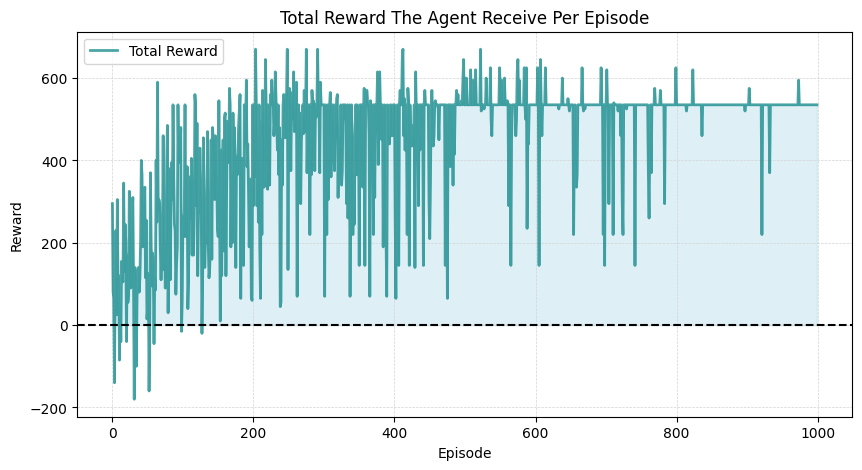

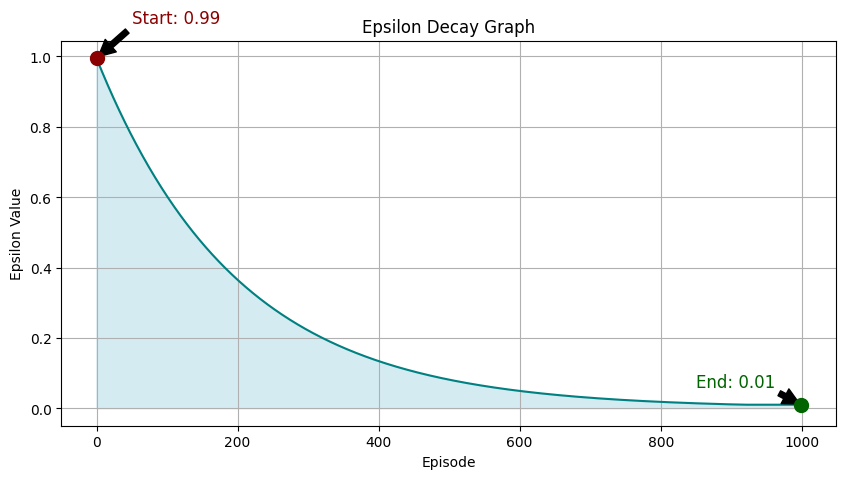

Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535
Episode 1000 Reward: 535


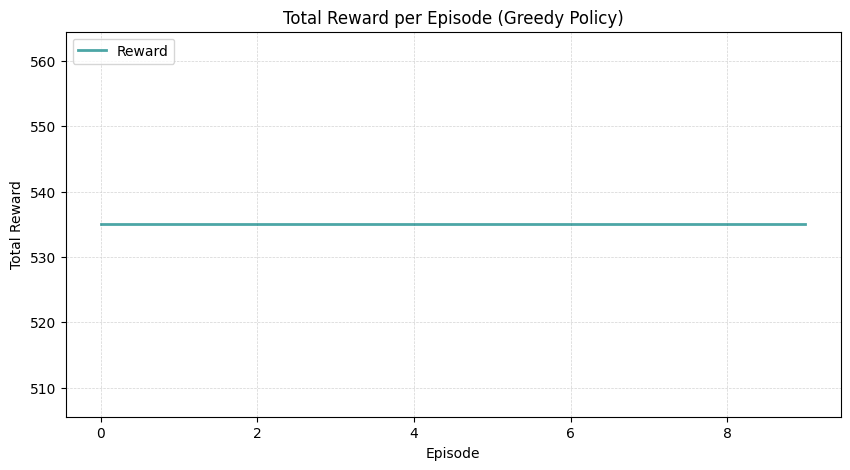

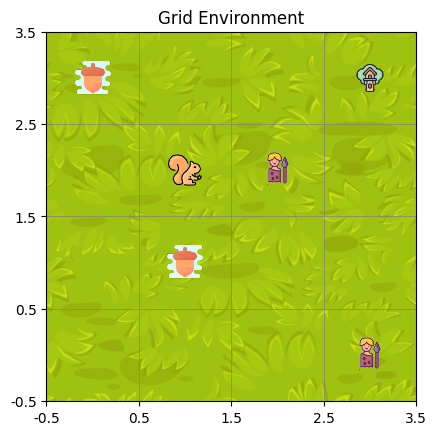

Max Timestamp, Decay Rate:  20, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[373.55360391  71.67027378  40.07962224 204.37520551]
 [187.18380752  -0.75         0.          -1.28625   ]
 [  0.           0.           0.           0.        ]
 [  0.           0.           0.           0.        ]
 [ 39.20398987  48.04951428 442.65323854 151.85720112]
 [  0.           0.           0.           0.        ]
 [148.26776677   0.           0.           0.        ]
 [  0.           0.           0.           0.        ]
 [180.01833923   0.           0.           0.        ]
 [347.86314633 151.013518    91.44376964  27.68439886]
 [  0.           0.           0.           0.        ]
 [  0.           0.           0.           0.        ]
 [  0.           0.         

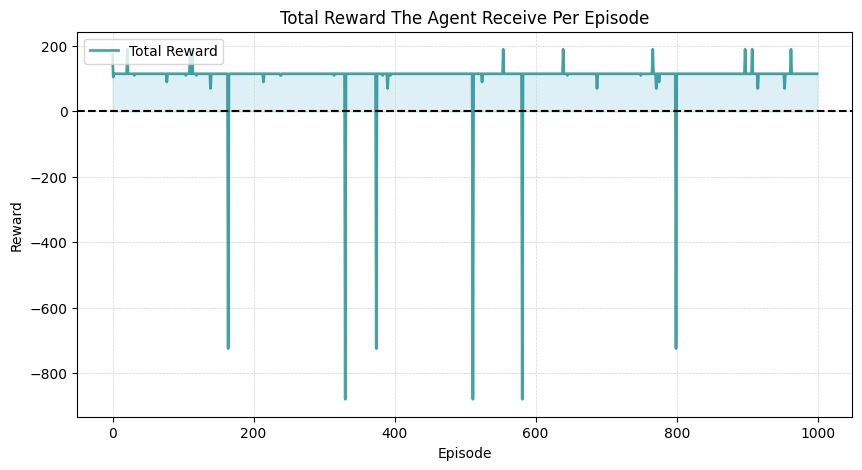

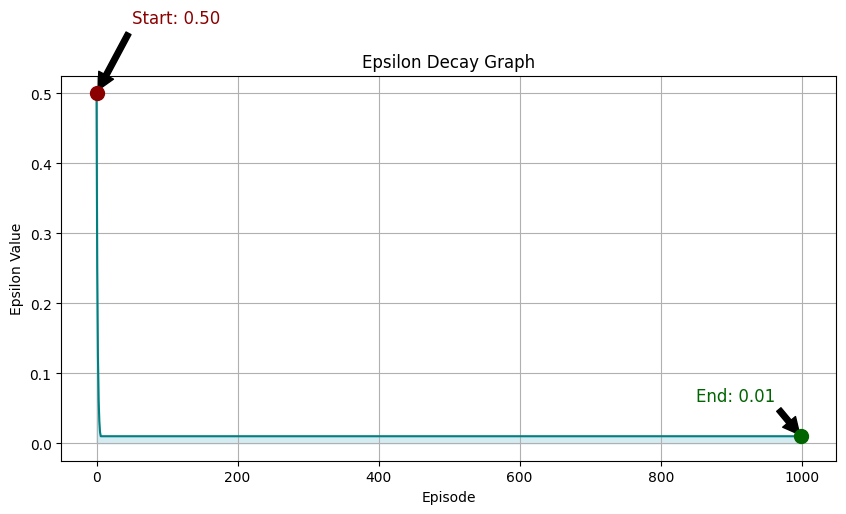

Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115
Episode 1000 Reward: 115


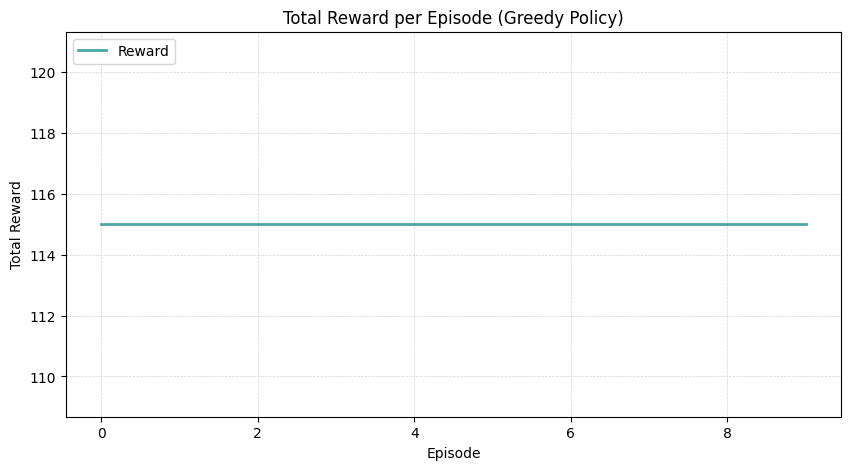

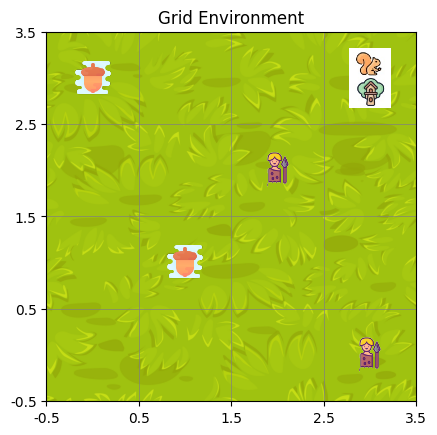

Max Timestamp, Decay Rate:  20, 0.75
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 6.38987824e+02  7.25734068e+02  7.49562424e+02  6.49177100e+02]
 [ 7.92834479e+02  2.88796339e+02  1.01331953e+02  2.64507278e+02]
 [ 8.34176261e+00 -7.50000000e-01  7.46243022e+02  5.36393161e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -1.27075312e+00  7.56674623e+02  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 6.66206373e+02  6.53616188e+02  5.65482442e+02  7.92950994e+02]
 [ 0.00000000e+00  7.16787299e+02  0.00000000e+00  2.43640067e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  7.60459255e+02  9.60921474e-01  0.00000000e+00]
 [ 0.00000000e+00

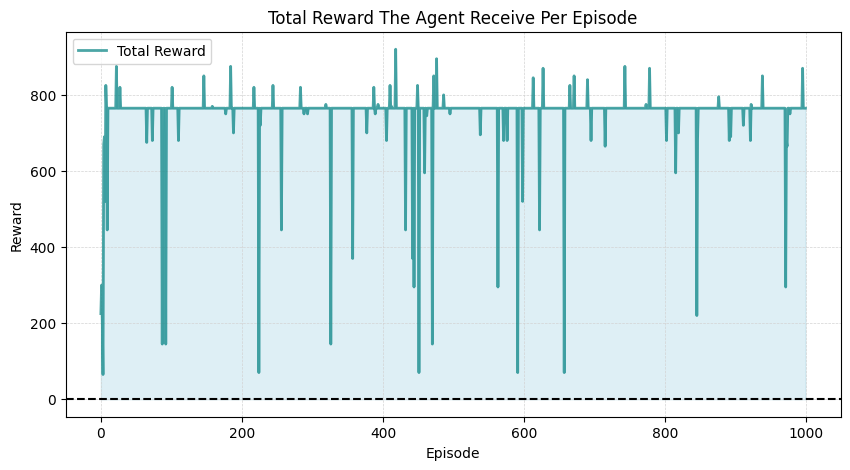

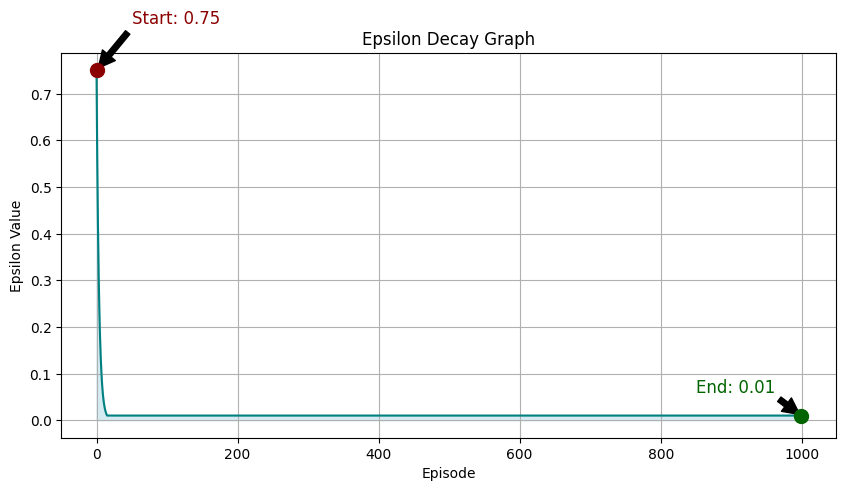

Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765


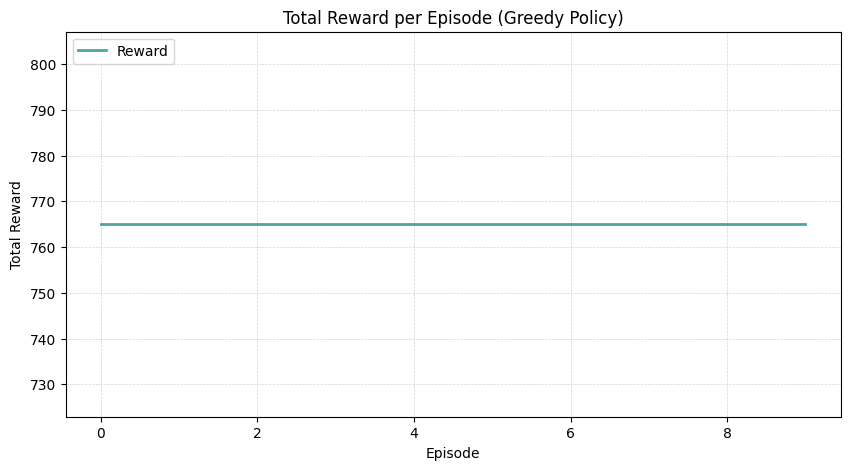

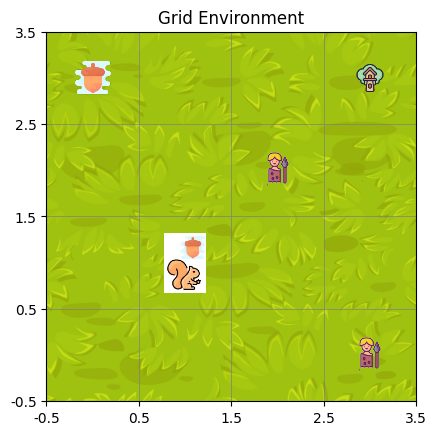

Max Timestamp, Decay Rate:  20, 0.995
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[730.76317821 731.89821346 742.21531758 737.56374657]
 [787.33257048 737.36212994 705.62824704 691.35903236]
 [632.76676341 507.18591034 619.78092102 740.23833301]
 [  0.           0.           0.           0.        ]
 [625.43606989 645.03462686 787.42338126 685.05542471]
 [  0.           0.           0.           0.        ]
 [690.31916467 692.03581163 731.5093874  785.60386448]
 [338.84625093 759.07590389 515.57827956 559.53896103]
 [347.01372959 302.73185331 736.64939132 418.69723789]
 [631.91701811 786.0239795  672.39059142 638.06742027]
 [  0.           0.           0.           0.        ]
 [710.44285412 346.2758193  431.77416158 485.66193405]
 [  0.           0.       

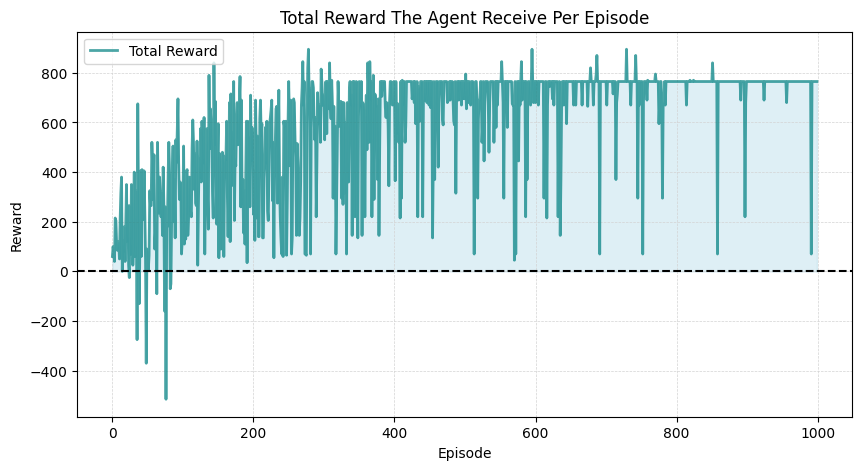

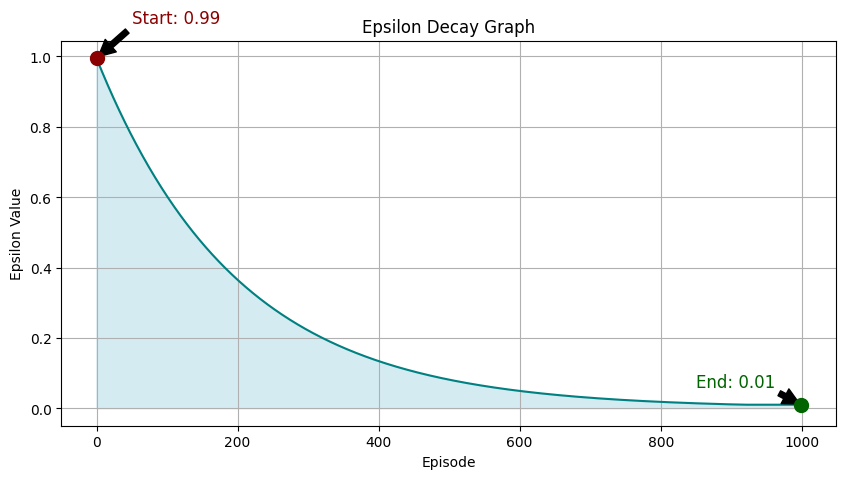

Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765
Episode 1000 Reward: 765


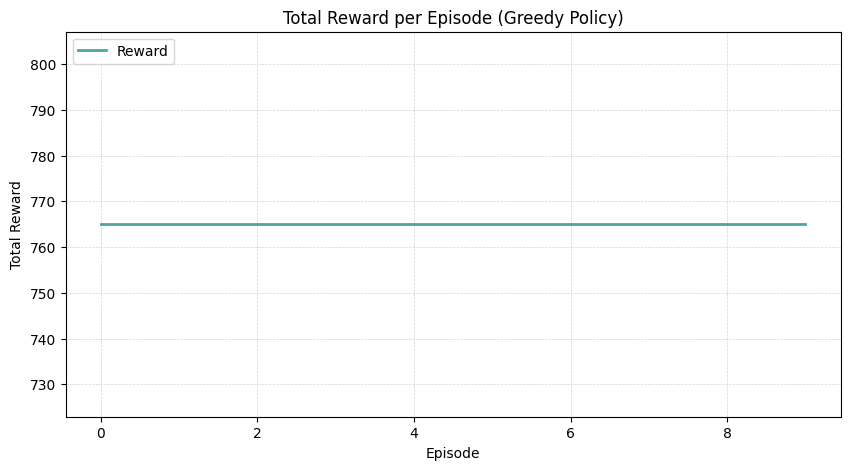

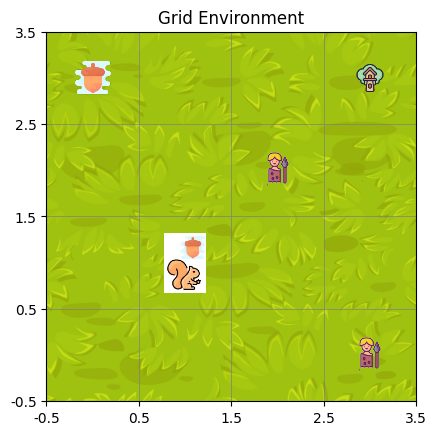

In [17]:
max_timestamp_values = [12, 15, 20]
decay_val = [0.500, 0.750, 0.995]

for mt in max_timestamp_values:
    for decay in decay_val:
        env = SquirrelPet( alpha=0.15, max_timestamp=mt)
        qt, rewards_epi, epsilon_values, final_state = training_loop(env, decay, max_timestamp)
        evaluate_loop(env, mt, decay, qt, rewards_epi, epsilon_values, final_state)

### Q learning on the STochastic Environment

In [18]:
env = SquirrelPet_stoch()

epsilon = 1.0  # Initial exploration rate
epsilon_min = 0.01  # Minimum exploration rate
gamma = 0.95  # Discount factor
alpha = 0.15  # Learning rate
decay_rate = 0.995  # Epsilon decay rate per episode
total_episodes = 1000 
max_timestamp = 10
qt = np.zeros((env.obs_space.n, env.action_space.n))

rewards_epi = []
epsilon_values = []
steps_per_episode = []
penalties_per_episode = []

final_state = None
for episode in range(total_episodes):
    state, _ = env.reset()
    state_index = env.obs_space_to_index(state)
    total_rewards = 0
    total_steps = 0  
    

    while True:

        if np.random.uniform(0, 1) < epsilon:
            action = env.action_space.sample()
        else:
            action = np.argmax(qt[state_index])
    

        next_state, reward, terminated, truncated, _ = env.step(action)
        total_steps += 1 
        next_strt_idx = env.obs_space_to_index(next_state)
        


        qt[state_index, action] += alpha * (reward + gamma * np.max(qt[next_strt_idx]) - qt[state_index, action])


        state_index = next_strt_idx
        total_rewards += reward
        
        if terminated or truncated:
            break
    
    penalties_per_episode.append(env.get_penalty_count())  
    
    # Q-table for every 100 episodes
    if (episode + 1) % 100 == 0:
        print(f"Episode: {episode + 1}")
        print("Q-table:")
        print(qt)

        # average penalties
        avg_penalty = np.mean(penalties_per_episode[-100:])
        print(f"Average Penalties in Last 100 Episodes: {avg_penalty}")

    epsilon = max(epsilon_min, epsilon * decay_rate)
    epsilon_values.append(epsilon)
    rewards_epi.append(total_rewards)
    steps_per_episode.append(total_steps)

    if (episode + 1) % 100 == 0:
        average_steps = np.mean(steps_per_episode[-100:])
        print(f"Episode: {episode + 1}, Average Steps: {average_steps}")

    if episode == total_episodes - 1:
        final_state = env.state


Requested Action: 3, Chosen Action: 3
Requested Action: 3, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 1
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 2
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Ac

In [19]:
# import pickle

# # Assuming qt is your Q-table after training
# qt = ...  # Your trained Q-table here

# # Save the Q-table with pickle
# with open('q_table_sto.pkl', 'wb') as f:
#     pickle.dump(qt, f)

# print("Q-table saved")


- Evaluation results for the Qlearning - Deterministic

- Print the initial and final q-table

In [20]:
initial_qt = np.zeros((env.obs_space.n, env.action_space.n))
print("Initial Q-table:")
print(initial_qt)

Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [21]:
print("\nTrained Q-table:")
print(qt)


Trained Q-table:
[[ 4.67383327e+02  4.86968601e+02  5.14345732e+02  4.85109695e+02]
 [ 5.66755548e+02  4.66705148e+02  4.80501664e+02  4.45694536e+02]
 [ 2.79986975e+02  3.46798300e+02  5.40700017e+02  3.96681285e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 4.23638995e+02  3.98737088e+02  5.57867675e+02  3.83497033e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 4.62861303e+02  4.43789817e+02  4.31484606e+02  5.45463356e+02]
 [ 2.04613134e+02  2.50303132e+02  2.53832740e+02  4.90281275e+02]
 [ 2.52452023e+02  4.92381262e+02  2.74275463e+02  2.23077927e+02]
 [ 1.64618498e+02  5.44895603e+02  2.74617567e+02  2.07215521e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 4.84634983e+02  1.29823785e+02  1.19773803e+02  2.04863872e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 8.02764586e+00  4.40814362e+02  1.17614301e+02  9.36204408e+01]
 [ 5.57554098e-01 -1.50000000e+00  4.3085864

- Total Reward / Episode

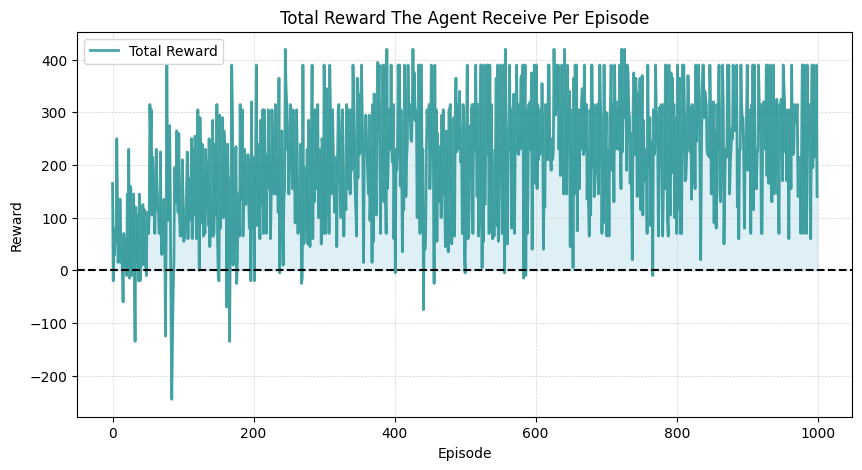

In [22]:
# total reward per episode graph
plt.figure(figsize=(10, 5))
plt.plot(rewards_epi, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Total Reward')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Total Reward The Agent Receive Per Episode')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')
plt.fill_between(range(len(rewards_epi)), rewards_epi, color="lightblue", alpha=0.4)
plt.axhline(y=0, color='black', linestyle='--')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


- Epsilon Decay

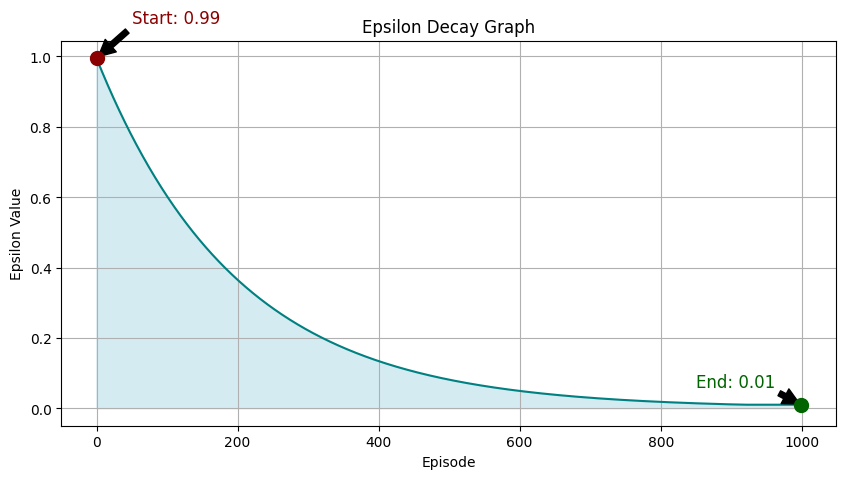

In [23]:
# epsilon decay graph
plt.figure(figsize=(10, 5))
plt.plot(epsilon_values, color='Teal', label='Decay')
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Graph')

plt.fill_between(range(len(epsilon_values)), epsilon_values, color="lightblue", alpha=0.5)

plt.scatter(0, epsilon_values[0], color='darkred', s=100, zorder=5, label='Start')
plt.scatter(len(epsilon_values)-1, epsilon_values[-1], color='darkgreen', s=100, zorder=5, label='End')

# Annotations
plt.annotate(f'Start: {epsilon_values[0]:.2f}', xy=(0, epsilon_values[0]), xytext=(50, epsilon_values[0]+0.1),
             arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkred')
plt.annotate(f'End: {epsilon_values[-1]:.2f}', xy=(len(epsilon_values)-1, epsilon_values[-1]), xytext=(len(epsilon_values)-150, epsilon_values[-1]+0.05),
             arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkgreen')



plt.grid(True)
plt.show()

-  environment for at 10 episodes, where the agent chooses only greedy actions from the learned policy. 

In [24]:
greedy_rewards = []
for _ in range(10):
    total_reward = 0
    state, _ = env.reset()
    state_index = env.obs_space_to_index(state)

    while True:
        action = np.argmax(qt[state_index])
        next_state, reward, terminated, truncated, _ = env.step(action)
        next_strt_idx = env.obs_space_to_index(next_state)
        total_reward += reward
        state_index = next_strt_idx
        if terminated or truncated:
            print(f"Episode {episode + 1} Reward: {round(total_reward, 4)}")
            break

    greedy_rewards.append(total_reward)



Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 0
Episode 1000 Reward: 365
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Episode 1000 Reward: 390
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 1


- Include a plot of the total reward per episode for the greedy actions above!.

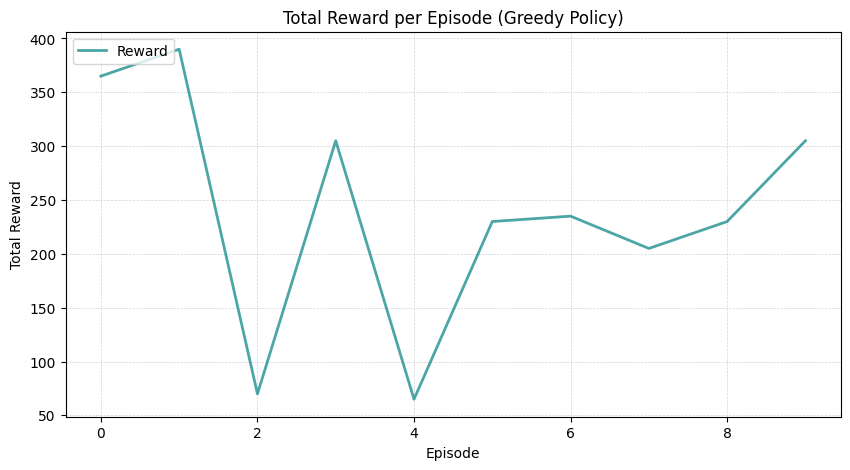

In [25]:
# total rewards for 10 episodes
plt.figure(figsize=(10, 5))
plt.plot(greedy_rewards, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Reward')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Total Reward per Episode (Greedy Policy)')

plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')

plt.legend(loc='upper left')
plt.grid(True)
plt.show()





Hyperparameter tuning. Select two hyperparameters to tune to get better results:

- Discount factor (γ)
- Epsilon decay rate
- Epsilon min/max values
- Number of episodes
- Max timesteps



In [26]:
performance_dict = {}

def training_loop(env, d , max_timestamp):
    

    epsilon = 1.0  # Initial exploration rate
    epsilon_min = 0.01  # Minimum exploration rate
    gamma = 0.95  # Discount factor
    alpha = 0.15  # Learning rate
    decay_rate = d  # Epsilon decay rate per episode
    total_episodes = 1000 
    max_timestamp = max_timestamp
    qt = np.zeros((env.obs_space.n, env.action_space.n))

    rewards_epi = []
    epsilon_values = []
    steps_per_episode = []
    penalties_per_episode = []

    final_state = None
    for episode in range(total_episodes):
        state, _ = env.reset()
        state_index = env.obs_space_to_index(state)
        total_rewards = 0
        total_steps = 0  
        

        while True:

            if np.random.uniform(0, 1) < epsilon:
                action = env.action_space.sample()
            else:
                action = np.argmax(qt[state_index])
        

            next_state, reward, terminated, truncated, _ = env.step(action)
            total_steps += 1 
            next_strt_idx = env.obs_space_to_index(next_state)
            


            qt[state_index, action] += alpha * (reward + gamma * np.max(qt[next_strt_idx]) - qt[state_index, action])


            state_index = next_strt_idx
            total_rewards += reward
            
            if terminated or truncated:
                break
        
        penalties_per_episode.append(env.get_penalty_count())  
        

        epsilon = max(epsilon_min, epsilon * decay_rate)
        epsilon_values.append(epsilon)
        rewards_epi.append(total_rewards)
        steps_per_episode.append(total_steps)


        if episode == total_episodes - 1:
            final_state = env.state

    final_reward = np.mean(rewards_epi[-100:]) 
    performance_dict[(alpha, gamma, max_timestamp)] = final_reward
    return qt, rewards_epi, epsilon_values, final_state
        


In [27]:
def evaluate_loop(env, max_timestamp, decay, qt, rewards_epi, epsilon_values, final_state):
    print(f"Max Timestamp, Decay Rate:  {max_timestamp}, {decay}")

    initial_qt = np.zeros((env.obs_space.n, env.action_space.n))
    print("Initial Q-table:")
    print(initial_qt)
    print("\nTrained Q-table:")
    print(qt)


    # total reward per episode graph
    plt.figure(figsize=(10, 5))
    plt.plot(rewards_epi, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Total Reward')
    plt.xlabel('Episode')
    plt.ylabel('Reward')
    plt.title('Total Reward The Agent Receive Per Episode')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')
    plt.fill_between(range(len(rewards_epi)), rewards_epi, color="lightblue", alpha=0.4)
    plt.axhline(y=0, color='black', linestyle='--')
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.show()



    # epsilon decay graph
    plt.figure(figsize=(10, 5))
    plt.plot(epsilon_values, color='Teal', label='Decay')
    plt.xlabel('Episode')
    plt.ylabel('Epsilon Value')
    plt.title('Epsilon Decay Graph')

    plt.fill_between(range(len(epsilon_values)), epsilon_values, color="lightblue", alpha=0.5)

    plt.scatter(0, epsilon_values[0], color='darkred', s=100, zorder=5, label='Start')
    plt.scatter(len(epsilon_values)-1, epsilon_values[-1], color='darkgreen', s=100, zorder=5, label='End')

    # Annotations
    plt.annotate(f'Start: {epsilon_values[0]:.2f}', xy=(0, epsilon_values[0]), xytext=(50, epsilon_values[0]+0.1),
                arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkred')
    plt.annotate(f'End: {epsilon_values[-1]:.2f}', xy=(len(epsilon_values)-1, epsilon_values[-1]), xytext=(len(epsilon_values)-150, epsilon_values[-1]+0.05),
                arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkgreen')
    plt.grid(True)
    plt.show()

    

    greedy_rewards = []
    for _ in range(10):
        total_reward = 0
        state, _ = env.reset()
        state_index = env.obs_space_to_index(state)

        while True:
            action = np.argmax(qt[state_index])
            next_state, reward, terminated, truncated, _ = env.step(action)
            next_strt_idx = env.obs_space_to_index(next_state)
            total_reward += reward
            state_index = next_strt_idx

            if terminated or truncated:
                print(f"Episode {episode + 1} Reward: {round(total_reward, 4)}")
                break

        greedy_rewards.append(total_reward)


        

    # total rewards for 10 episodes
    plt.figure(figsize=(10, 5))
    plt.plot(greedy_rewards, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Reward')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Reward per Episode (Greedy Policy)')

    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')

    plt.legend(loc='upper left')
    plt.grid(True)
    plt.show()




    env.state = final_state
    env.render()   

Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Ac

Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 1
Requested Ac

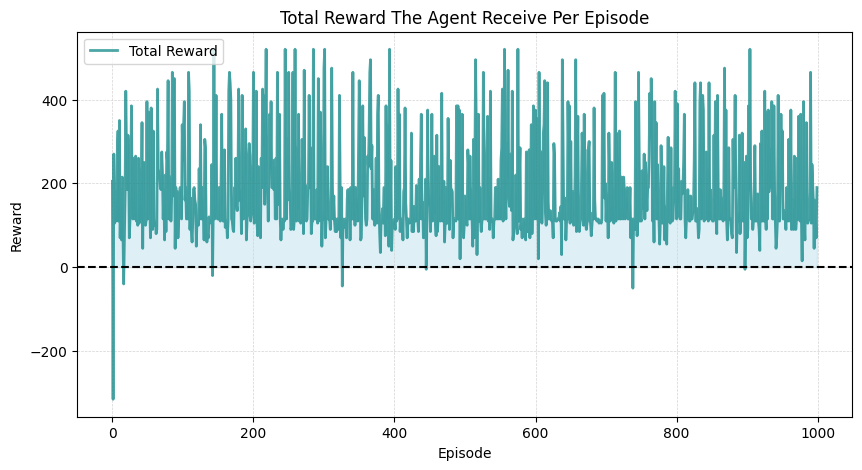

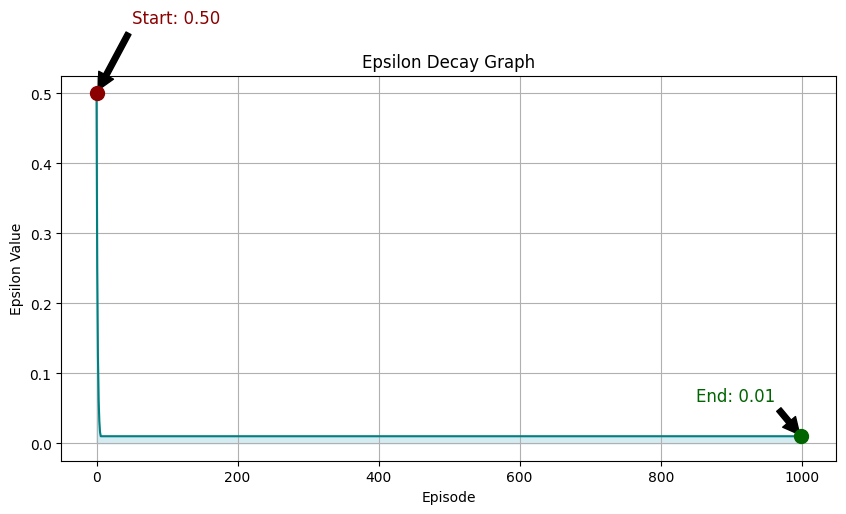

Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Episode 1000 Reward: 240
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 1
Requested Action: 0, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Episode 1000 Reward: 330
Requested Action: 2, Chosen Action: 2


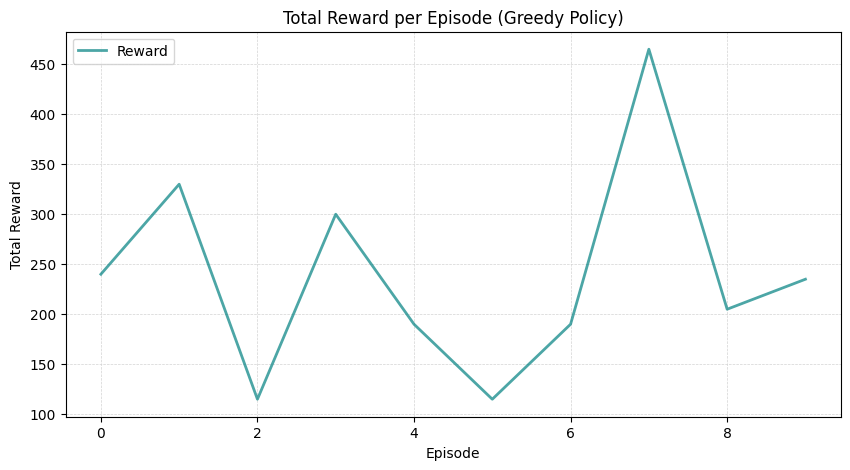

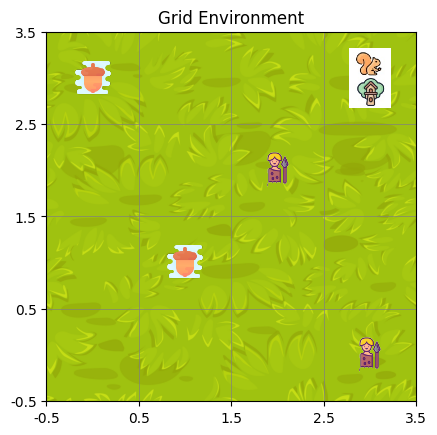

Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 1, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Ac

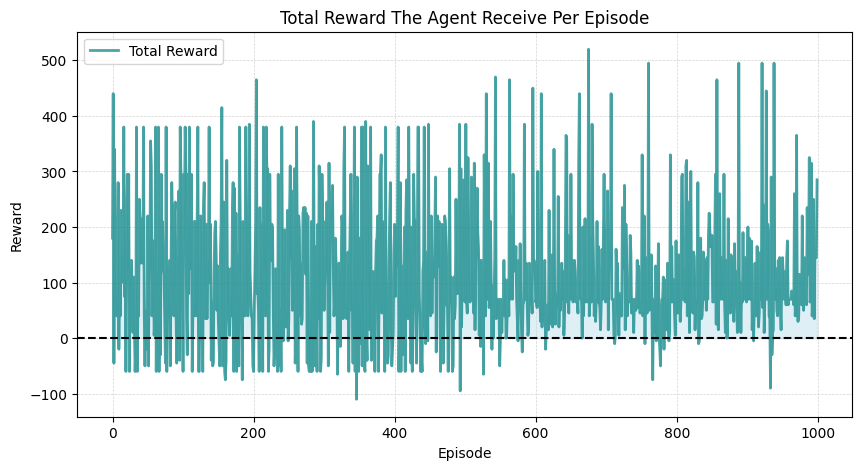

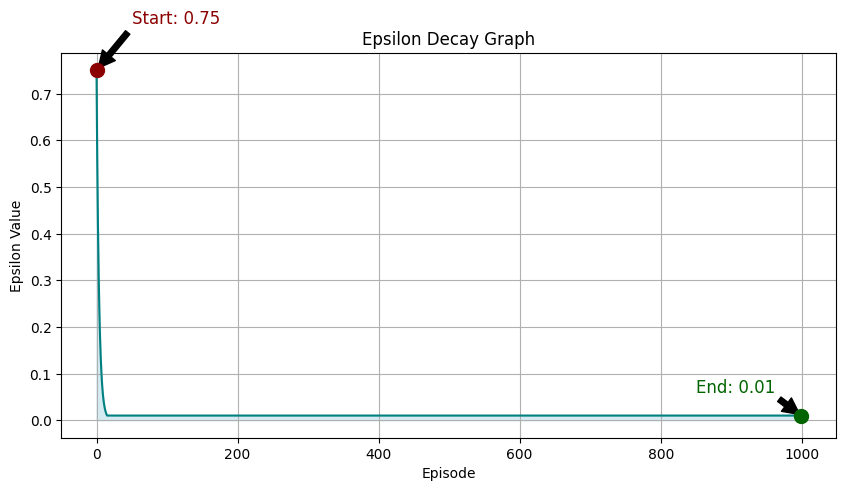

Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 1
Episode 1000 Reward: 140
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Episode 1000 Reward: 145
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2


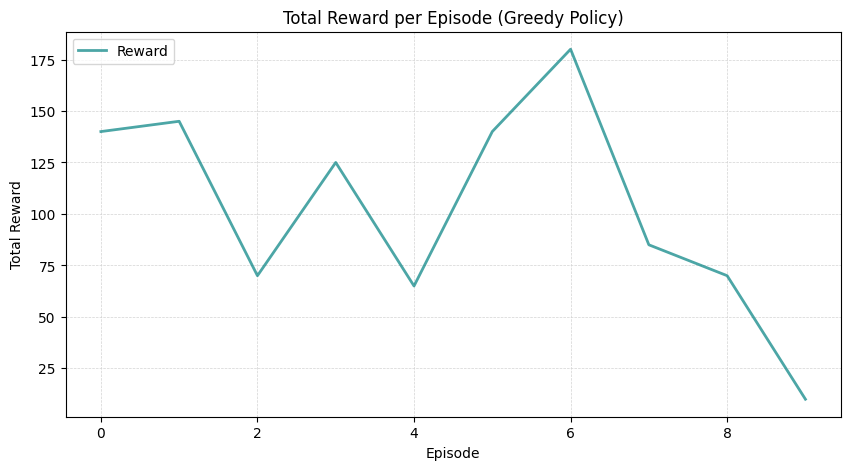

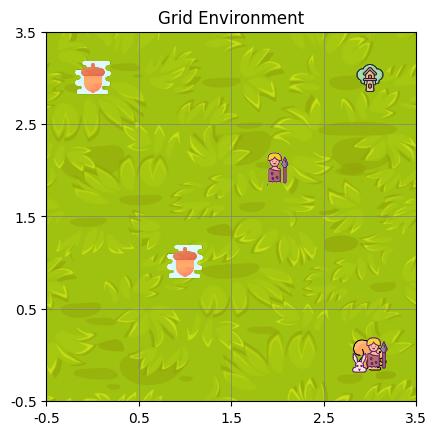

Requested Action: 3, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Ac

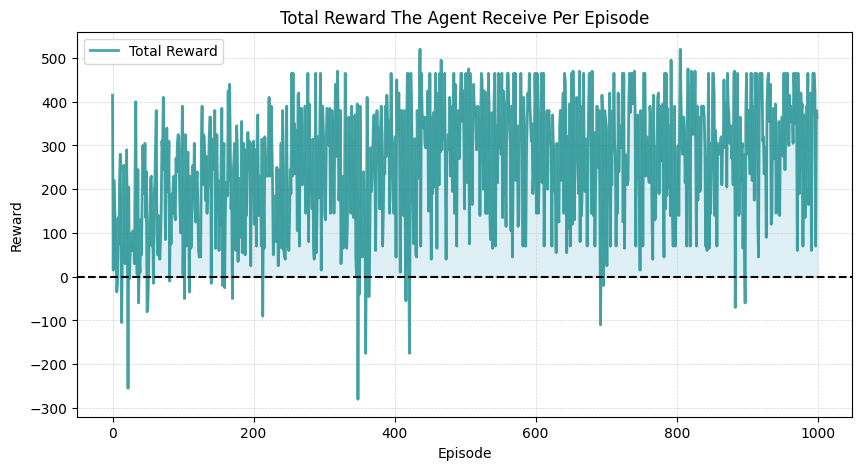

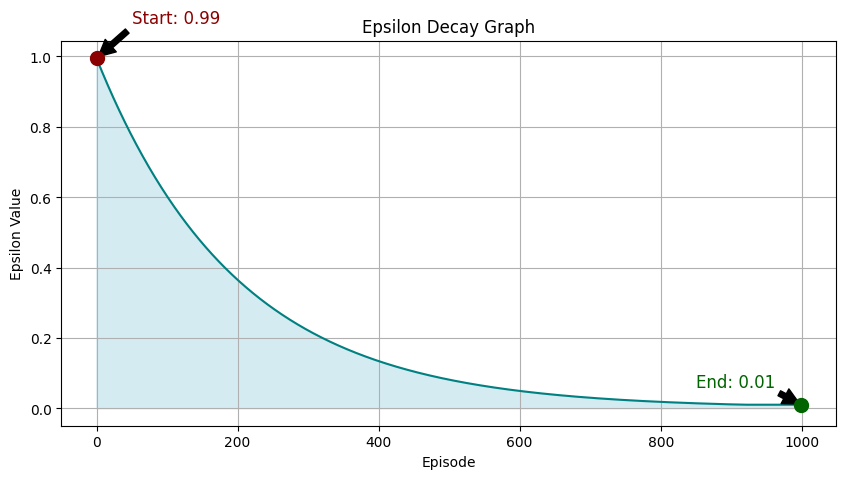

Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 1
Requested Action: 0, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 1
Episode 1000 Reward: 295
Requested Action: 2, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 1
Requested Action: 2, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Episode 1000 Reward: 390
Requested Action: 2, Chosen Action: 3


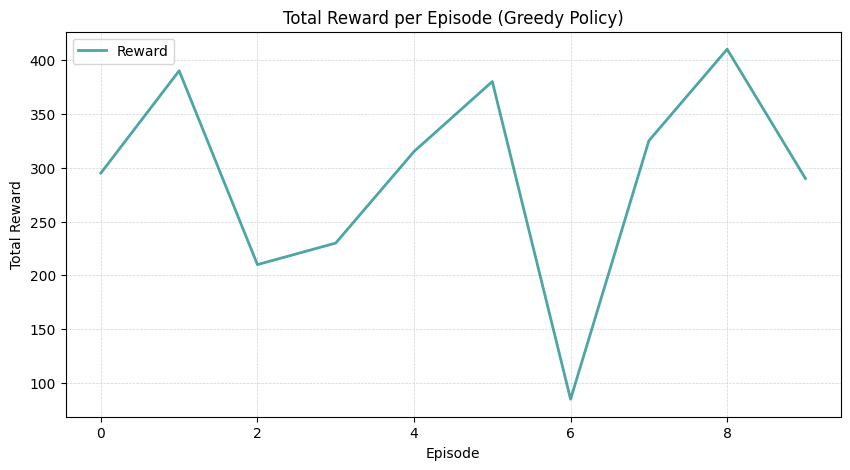

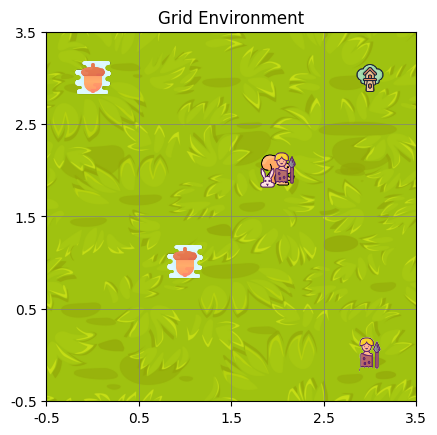

Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 1
Requested Action: 1, Chosen Action: 0
Requested Action: 1, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 3, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 0
Requested Action: 3, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Ac

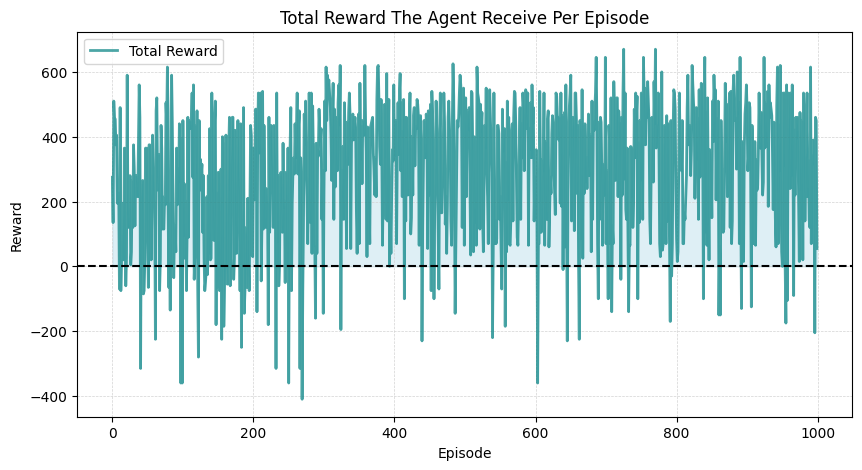

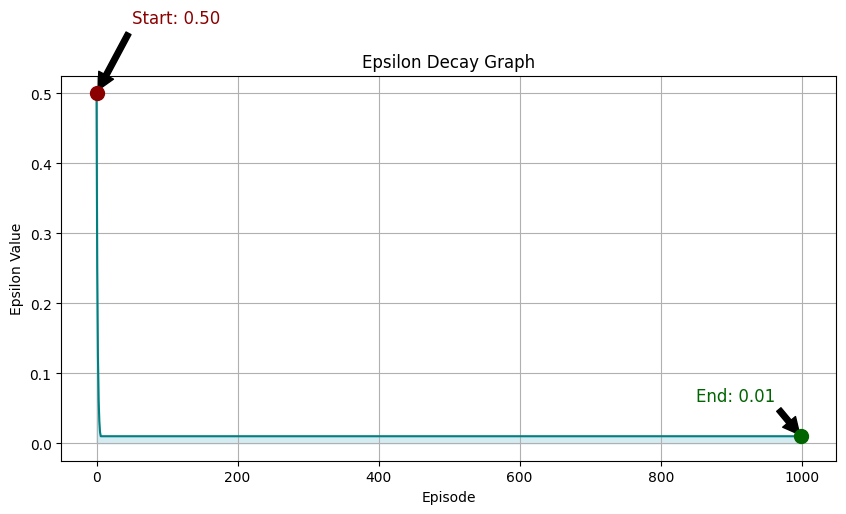

Requested Action: 2, Chosen Action: 0
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Episode 1000 Reward: 460
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chos

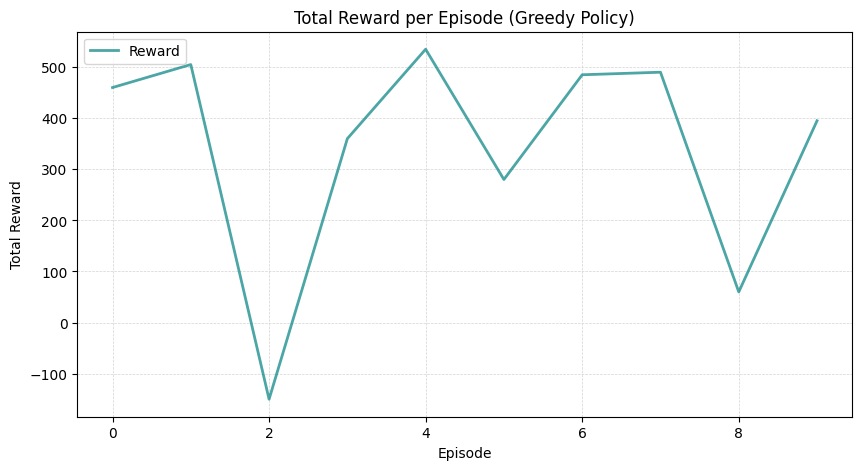

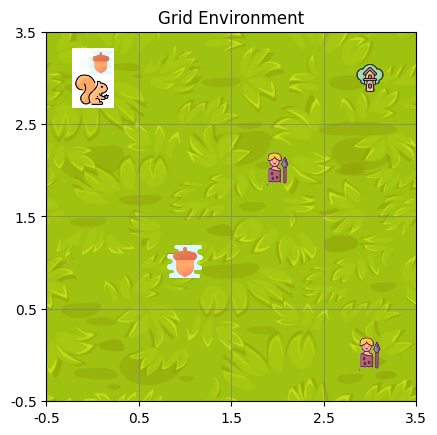

Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Ac

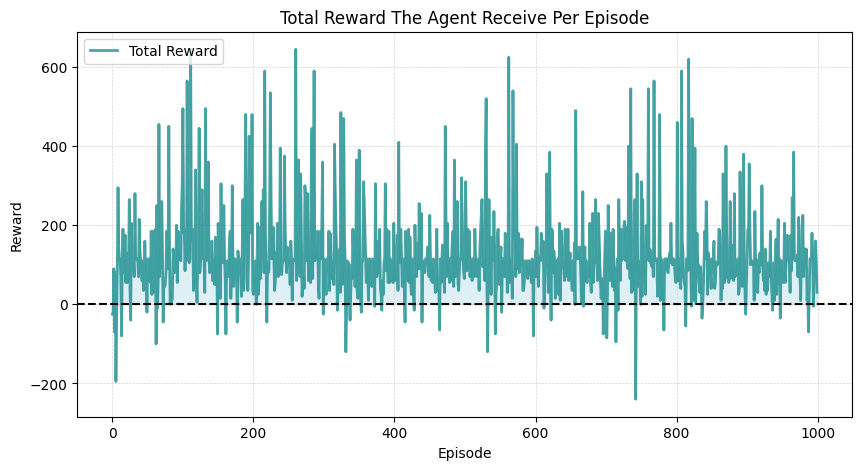

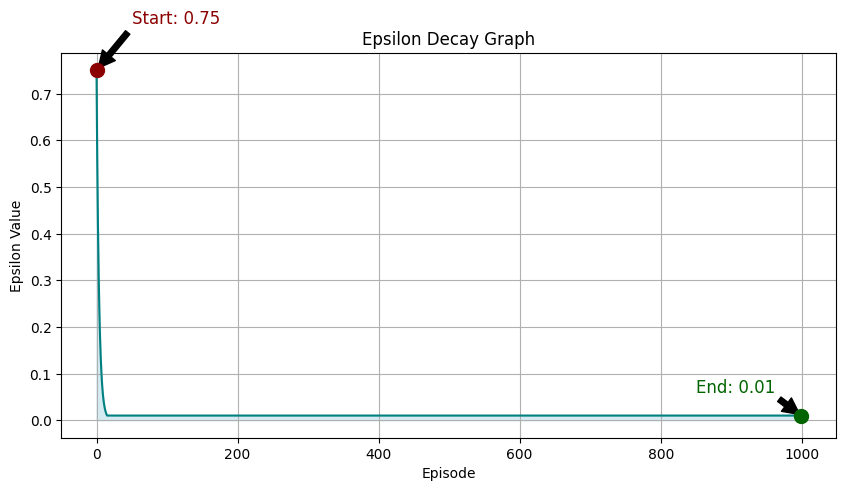

Requested Action: 2, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Episode 1000 Reward: 35
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 2
Episode 1000 Reward: 115
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 1
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Episode 1000 Reward: 55
Requested Action: 2, Chosen Action: 2
Requested Actio

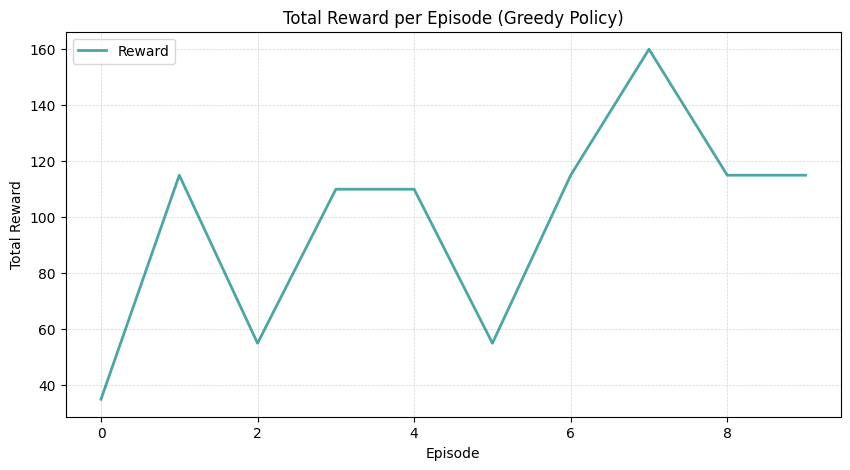

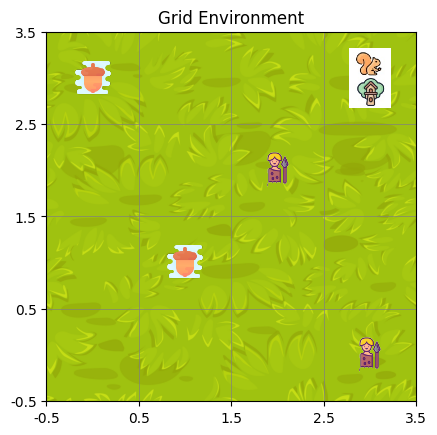

Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 0
Requested Ac

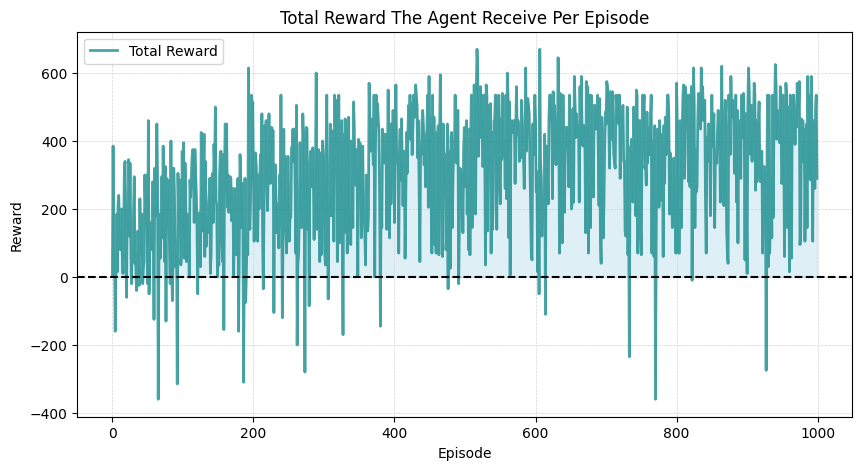

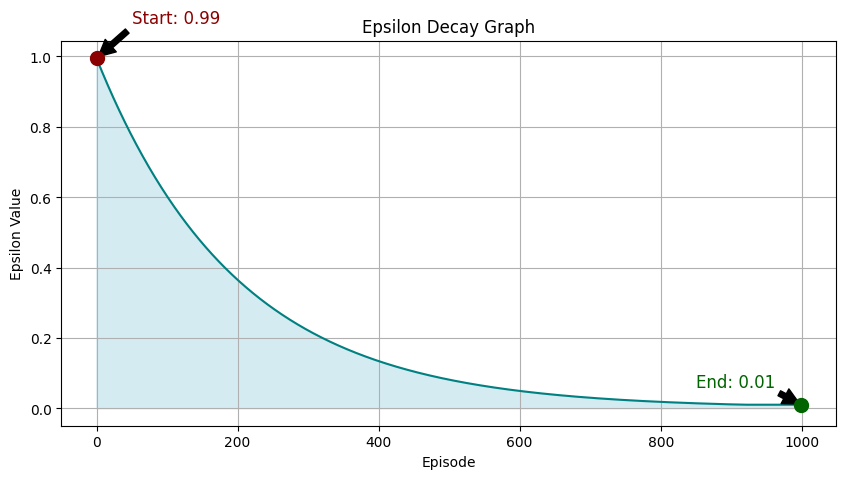

Requested Action: 2, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 3
Episode 1000 Reward: 535
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 2
Requested Action: 1, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chos

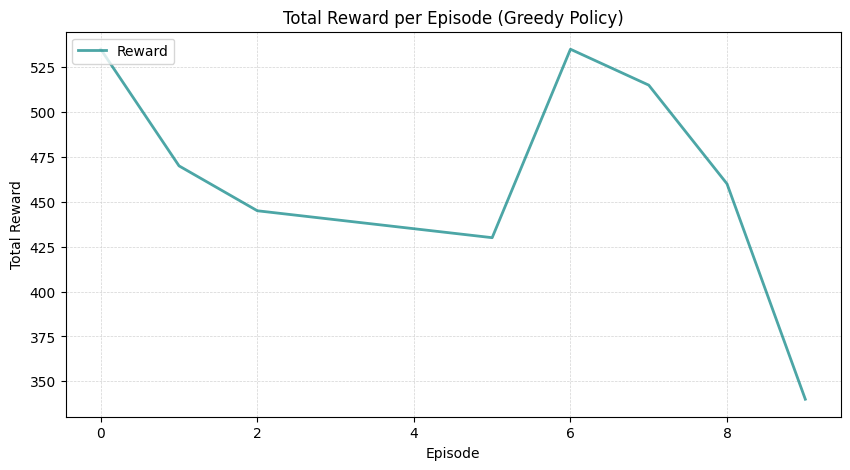

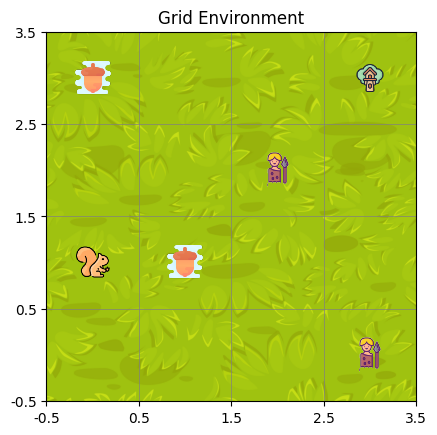

Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Ac

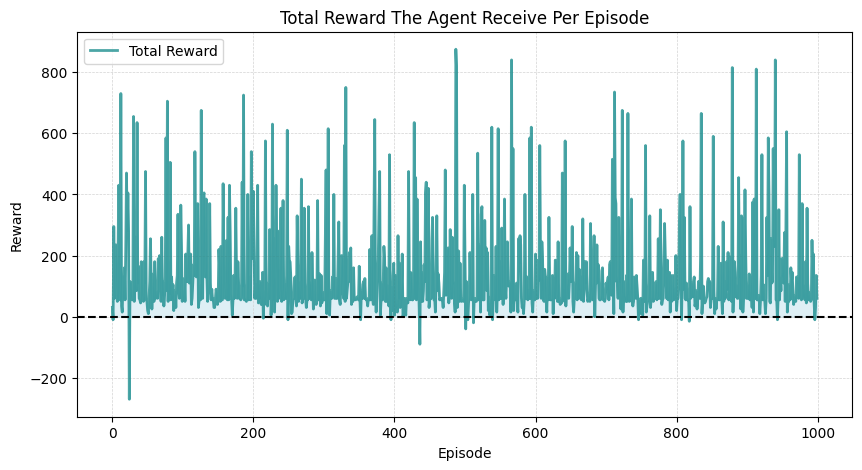

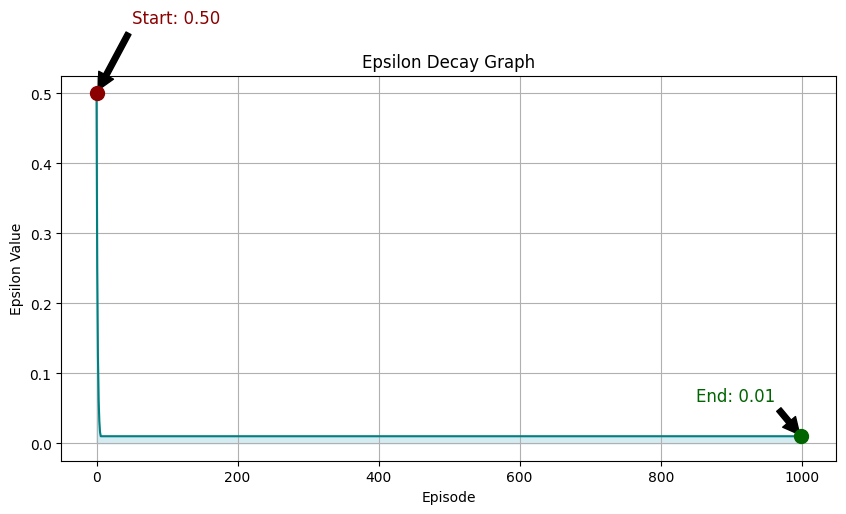

Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Episode 1000 Reward: 40
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 0
Requested Action: 2, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Episode 1000 Reward: 280
R

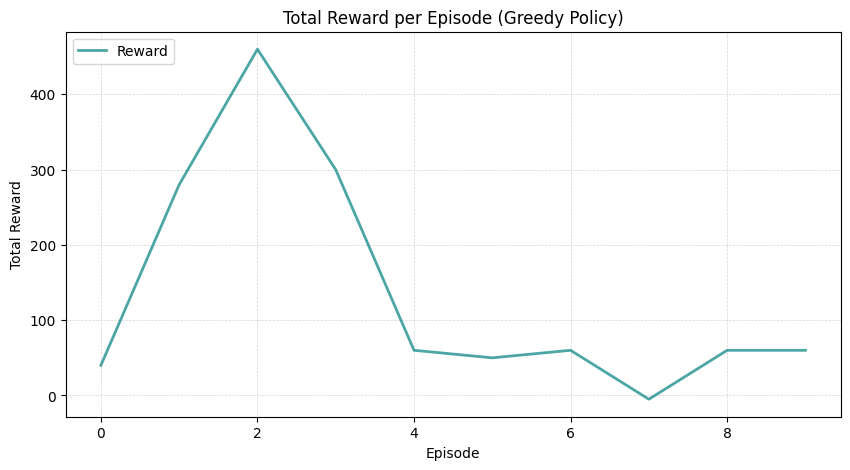

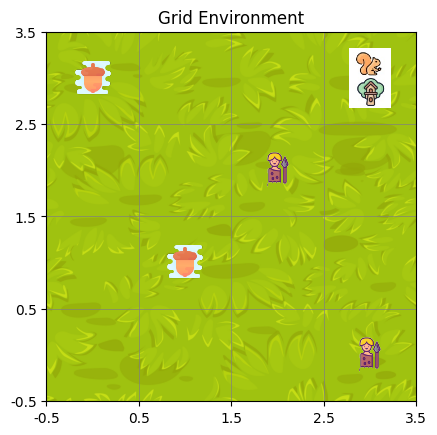

Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 0
Requested Ac

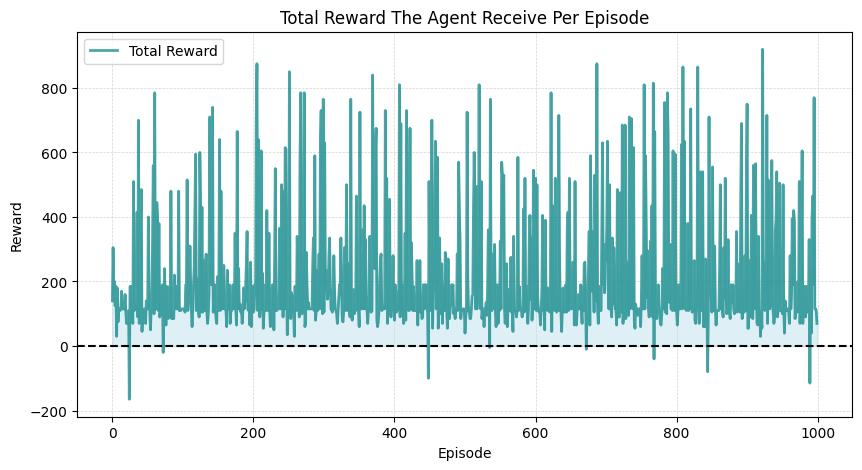

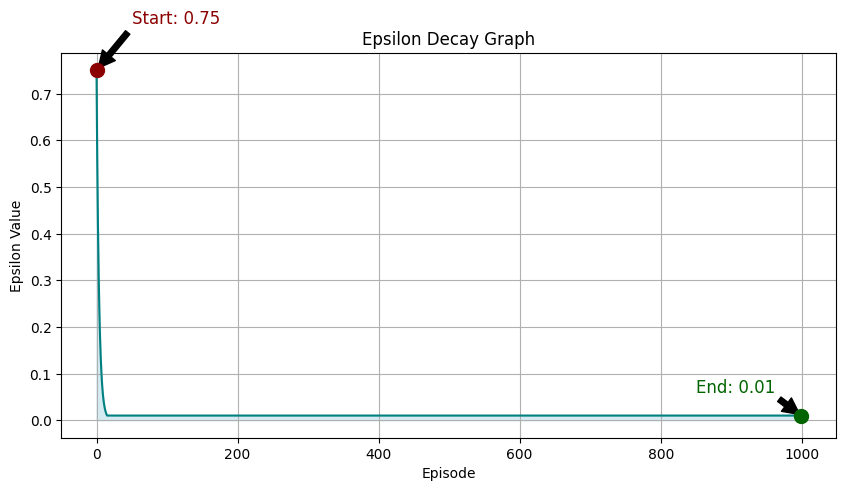

Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Episode 1000 Reward: 105
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Episode 1000 Reward: 70
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 0
Episode 1000 Reward: 110
Requested Action: 2, Chosen Action: 2
Requested Acti

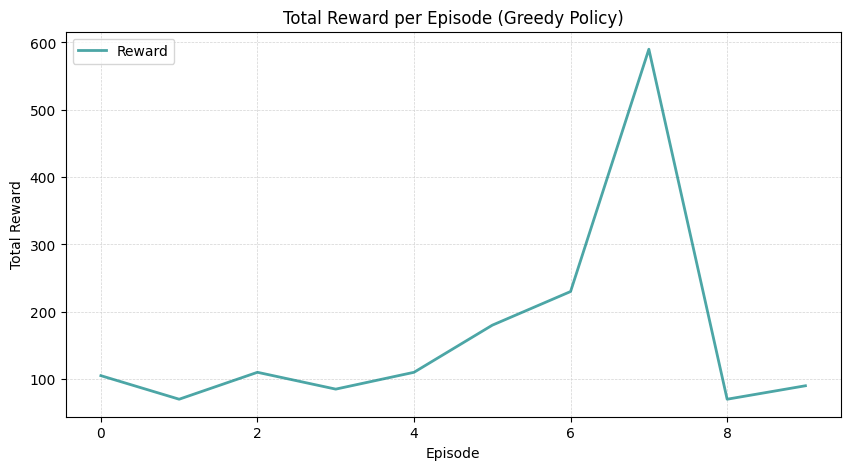

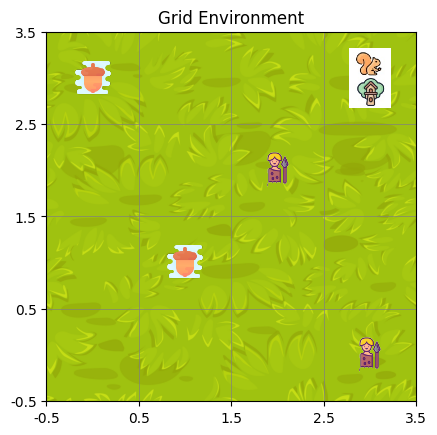

Requested Action: 1, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 2
Requested Action: 1, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 1, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 0, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 1, Chosen Action: 2
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 3, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 1, Chosen Action: 2
Requested Action: 0, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Ac

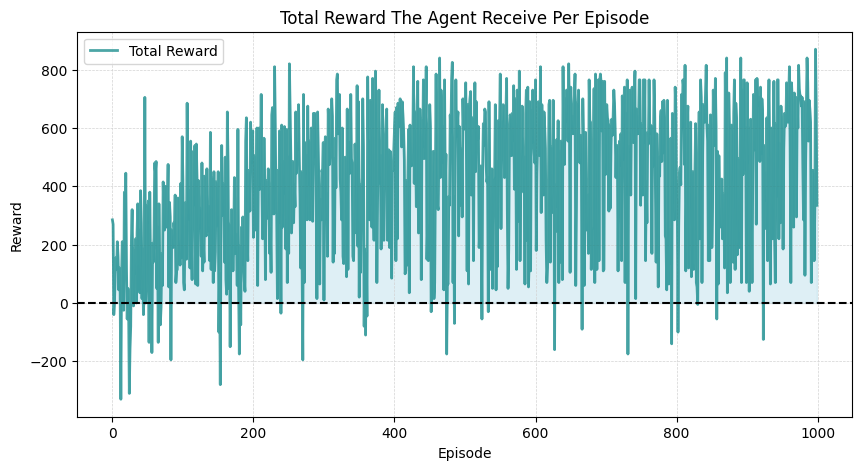

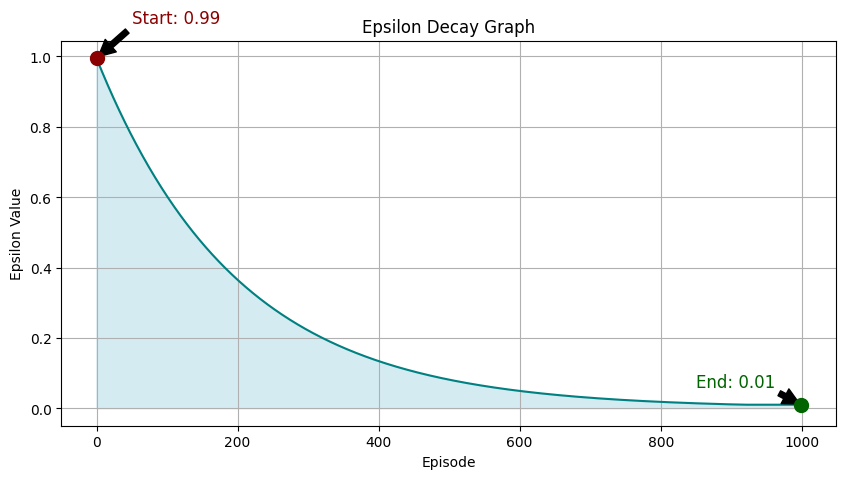

Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 2
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Episode 1000 Reward: 645
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 1
Requested Action: 0, Chos

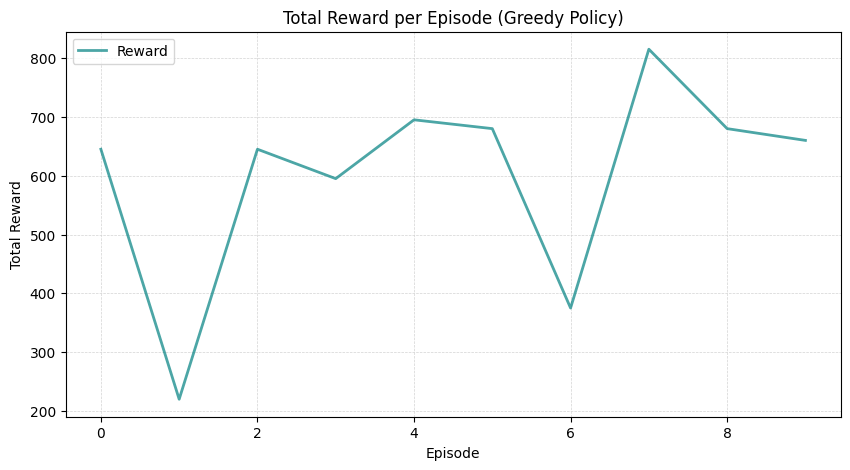

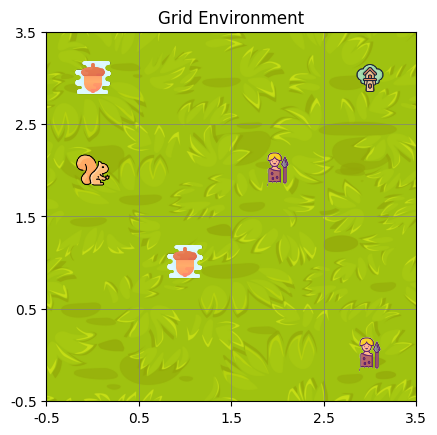

In [28]:
max_timestamp_values = [12, 15, 20]
decay_val = [0.500, 0.750, 0.995]

for mt in max_timestamp_values:
    for decay in decay_val:
        env = SquirrelPet_stoch( alpha=0.15, max_timestamp=mt)
        qt, rewards_epi, epsilon_values, final_state = training_loop(env, decay, max_timestamp)
        evaluate_loop(env, mt, decay, qt, rewards_epi, epsilon_values, final_state)

## Other Tablular Method - Double Q

### For Deterministic Environment

In [29]:
env = SquirrelPet()
epsilon = 1.0  
epsilon_min = 0.01  
gamma = 0.95 
alpha = 0.15 
decay_rate = 0.995  
total_episodes = 1000
max_timestamp = 10

qt1 = np.zeros((env.obs_space.n, env.action_space.n))  # Q-table 1 initialization
qt2 = np.zeros((env.obs_space.n, env.action_space.n))  # Q-table 2 initialization

rewards_epi = []
epsilon_values = []
steps_per_episode = []
penalties_per_episode = []

final_state = None

for episode in range(total_episodes):
    state, _ = env.reset()
    state_index = env.obs_space_to_index(state)
    total_rewards = 0
    total_steps = 0

    while True:
        total_steps += 1
        action = env.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax((qt1[state_index] + qt2[state_index]) / 2)
        next_state, reward, terminated, truncated, _ = env.step(action)
        next_strt_idx = env.obs_space_to_index(next_state)
        if np.random.uniform(0, 1) < 0.5:
            qt1[state_index, action] += alpha * (reward + gamma * qt2[next_strt_idx, np.argmax(qt1[next_strt_idx])] - qt1[state_index, action])
        else:
            qt2[state_index, action] += alpha * (reward + gamma * qt1[next_strt_idx, np.argmax(qt2[next_strt_idx])] - qt2[state_index, action])
        state_index = next_strt_idx
        total_rewards += reward
        if terminated or truncated or total_steps >= max_timestamp:
            break

    penalties_per_episode.append(env.get_penalty_count())
    if (episode + 1) % 100 == 0:
        print(f"Episode: {episode + 1}")
        print("Q-table 1:")
        print(qt1)
        print("Q-table 2:")
        print(qt2)
        avg_penalty = np.mean(penalties_per_episode[-100:])
        print(f"Average Penalties in Last 100 Episodes: {avg_penalty}")

    epsilon = max(epsilon_min, epsilon * decay_rate)
    epsilon_values.append(epsilon)
    rewards_epi.append(total_rewards)
    steps_per_episode.append(total_steps)

    if (episode + 1) % 100 == 0:
        average_steps = np.mean(steps_per_episode[-100:])
        print(f"Episode: {episode + 1}, Average Steps: {average_steps}")

    if episode == total_episodes - 1:
        final_state = env.state

Episode: 100
Q-table 1:
[[122.55248351  94.92371725 105.15089081  95.35365562]
 [163.27454864  51.35314372  40.72800624  48.51260594]
 [ 32.21309189  16.21186432 107.13880473  51.01106218]
 [  0.           0.           0.           0.        ]
 [  4.43409301  55.3868515  170.63226209  46.01050564]
 [  0.           0.           0.           0.        ]
 [ 38.32976145   9.83198341  26.81952025 145.43183723]
 [  0.         104.58452184   6.6085708    0.67415526]
 [  4.48514774  36.26191747   8.26383089  -2.51883586]
 [  9.27443927 116.2712875   15.32975199  -1.48074017]
 [  0.           0.           0.           0.        ]
 [ 17.10569831   0.           5.26354079   0.64031147]
 [  0.           0.           0.           0.        ]
 [ -1.929375    22.07472977   1.5         -5.59962743]
 [ -0.75        25.91989069   0.           0.        ]
 [  0.           0.           0.           0.        ]]
Q-table 2:
[[107.26752189 107.18804793 108.52705895 115.5309421 ]
 [167.36888698  80.00109886  

In [30]:
# import pickle

# # Assuming the above loop has been executed and qt1, qt2, rewards_epi, epsilon_values, steps_per_episode, and penalties_per_episode are populated

# # Creating a dictionary to hold everything
# data_to_save = {
#     "qt1": qt1,
#     "qt2": qt2,
#     "rewards_epi": rewards_epi,
#     "epsilon_values": epsilon_values,
#     "steps_per_episode": steps_per_episode,
#     "penalties_per_episode": penalties_per_episode,
#     "final_state": final_state
# }

# # Saving to a pickle file
# with open('q_tables_and_stats.pkl', 'wb') as f:
#     pickle.dump(data_to_save, f)

# print("Data saved to q_tables_and_stats.pkl")


In [31]:
print("Trained Q-table 1:")
print(qt1)
print("Trained Q-table 2:")
print(qt2)

Trained Q-table 1:
[[7.57388194e+02 6.45217576e+02 6.44586651e+02 6.97123934e+02]
 [7.45513679e+02 1.02793380e+02 6.46164039e+01 8.31395369e+01]
 [3.22130919e+01 2.76024502e+01 1.92595028e+02 1.03917647e+02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [5.56299744e+02 4.76919479e+02 7.96185418e+02 3.28278729e+02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [1.76818616e+02 3.20987791e+01 7.20284677e+01 7.05372533e+02]
 [8.73768121e+00 2.11950670e+02 1.62869608e+01 1.46209894e+01]
 [9.24711706e+01 2.25172372e+02 7.04582676e+02 1.80755358e+02]
 [5.60981029e+02 7.95238533e+02 6.39423367e+02 6.15517290e+02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [2.64874105e+02 1.59774648e+01 5.26354079e+00 6.40311472e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [2.22692618e+01 5.49132842e+02 4.78227647e+01 1.31440463e+02]
 [1.25192634e+02 6.00731827e+02 1.30246258e+02 1.44680340e+02]
 [0.00000000e+00 0.00000000e+00 0.00

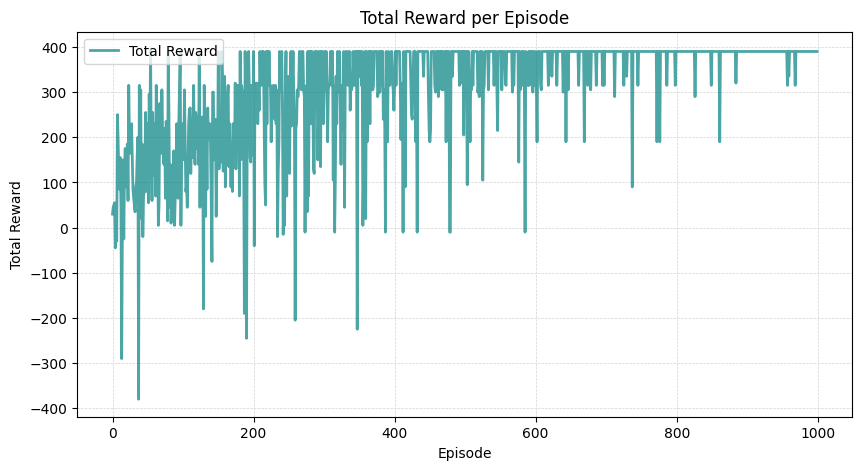

In [32]:
plt.figure(figsize=(10, 5))
plt.plot(rewards_epi, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Total Reward')
plt.title('Total Reward per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')
plt.legend(loc='upper left')
plt.show()

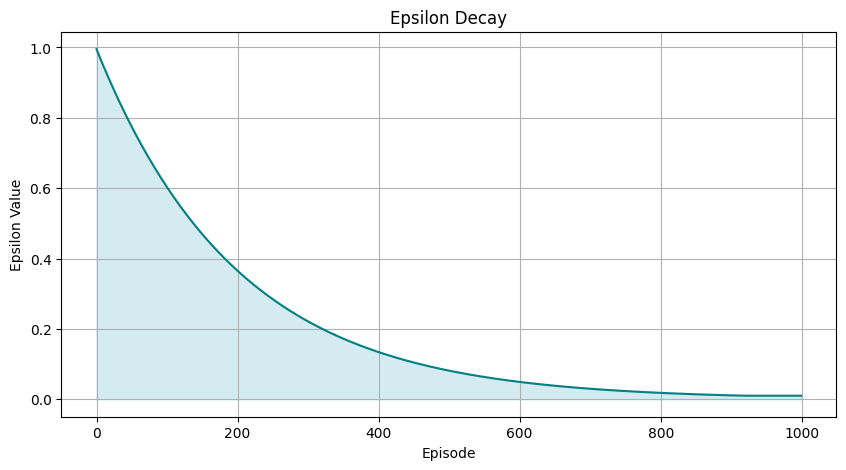

In [33]:

plt.figure(figsize=(10, 5))
plt.plot(epsilon_values, color='Teal', label='Decay')
plt.title('Epsilon Decay')
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.fill_between(range(len(epsilon_values)), epsilon_values, color="lightblue", alpha=0.5)
plt.grid(True)
plt.show()

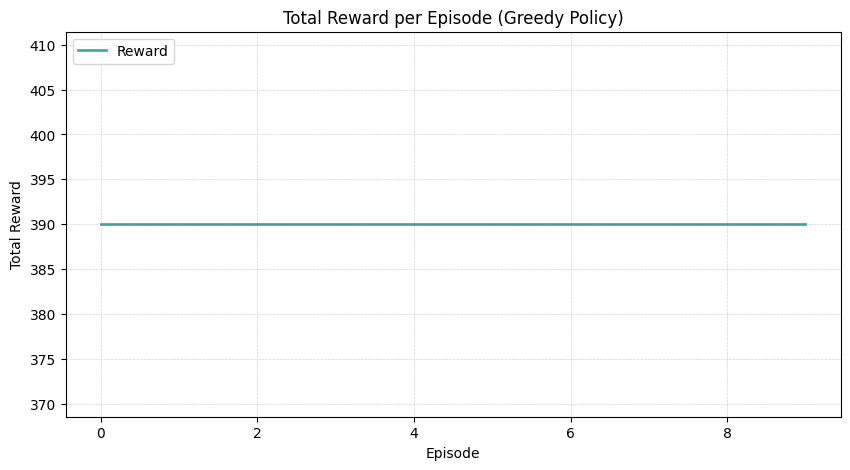

In [34]:
greedy_rewards = []
for _ in range(10):
    state, _ = env.reset()
    state_index = env.obs_space_to_index(state)
    total_greedy_rewards = 0
    while True:
        action = np.argmax((qt1[state_index] + qt2[state_index]) / 2)
        next_state, reward, terminated, truncated, _ = env.step(action)
        state_index = env.obs_space_to_index(next_state)
        total_greedy_rewards += reward

        if terminated or truncated:
            break

    greedy_rewards.append(total_greedy_rewards)


plt.figure(figsize=(10, 5))
plt.plot(greedy_rewards, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Reward')
plt.title('Total Reward per Episode (Greedy Policy)')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')
plt.legend(loc='upper left')
plt.show()

### For Stochastic Environment

In [35]:
env = SquirrelPet_stoch()
epsilon = 1.0  
epsilon_min = 0.01  
gamma = 0.95 
alpha = 0.15 
decay_rate = 0.995  
total_episodes = 1000
max_timestamp = 10

qt1 = np.zeros((env.obs_space.n, env.action_space.n))  # Q-table 1 initialization
qt2 = np.zeros((env.obs_space.n, env.action_space.n))  # Q-table 2 initialization

rewards_epi = []
epsilon_values = []
steps_per_episode = []
penalties_per_episode = []

final_state = None

for episode in range(total_episodes):
    state, _ = env.reset()
    state_index = env.obs_space_to_index(state)
    total_rewards = 0
    total_steps = 0

    while True:
        total_steps += 1
        action = env.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax((qt1[state_index] + qt2[state_index]) / 2)
        next_state, reward, terminated, truncated, _ = env.step(action)
        next_strt_idx = env.obs_space_to_index(next_state)
        if np.random.uniform(0, 1) < 0.5:
            qt1[state_index, action] += alpha * (reward + gamma * qt2[next_strt_idx, np.argmax(qt1[next_strt_idx])] - qt1[state_index, action])
        else:
            qt2[state_index, action] += alpha * (reward + gamma * qt1[next_strt_idx, np.argmax(qt2[next_strt_idx])] - qt2[state_index, action])
        state_index = next_strt_idx
        total_rewards += reward
        if terminated or truncated or total_steps >= max_timestamp:
            break

    penalties_per_episode.append(env.get_penalty_count())
    if (episode + 1) % 100 == 0:
        print(f"Episode: {episode + 1}")
        print("Q-table 1:")
        print(qt1)
        print("Q-table 2:")
        print(qt2)
        avg_penalty = np.mean(penalties_per_episode[-100:])
        print(f"Average Penalties in Last 100 Episodes: {avg_penalty}")

    epsilon = max(epsilon_min, epsilon * decay_rate)
    epsilon_values.append(epsilon)
    rewards_epi.append(total_rewards)
    steps_per_episode.append(total_steps)

    if (episode + 1) % 100 == 0:
        average_steps = np.mean(steps_per_episode[-100:])
        print(f"Episode: {episode + 1}, Average Steps: {average_steps}")

    if episode == total_episodes - 1:
        final_state = env.state

Requested Action: 1, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 3, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 0, Chosen Action: 0
Requested Action: 3, Chosen Action: 3
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Ac

In [36]:
import pickle

# Assuming the above loop has been executed and qt1, qt2, rewards_epi, epsilon_values, steps_per_episode, and penalties_per_episode are populated

# Creating a dictionary to hold everything
data_to_save = {
    "qt1": qt1,
    "qt2": qt2,
    "rewards_epi": rewards_epi,
    "epsilon_values": epsilon_values,
    "steps_per_episode": steps_per_episode,
    "penalties_per_episode": penalties_per_episode,
    "final_state": final_state
}

# Saving to a pickle file
with open('q_tables_and_stats.pkl', 'wb') as f:
    pickle.dump(data_to_save, f)

print("Data saved to q_tables_and_stats.pkl")


Data saved to q_tables_and_stats.pkl


In [37]:
print("Trained Q-table 1:")
print(qt1)
print("Trained Q-table 2:")
print(qt2)

Trained Q-table 1:
[[ 4.30380870e+02  3.95137780e+02  4.80762957e+02  3.99800136e+02]
 [ 5.21702532e+02  3.26663309e+02  2.90226925e+02  3.05498620e+02]
 [ 1.36493780e+02  2.35449326e+02  5.02968503e+02  2.84073514e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.40985516e+02  1.75434987e+02  5.07540895e+02  2.01125542e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 3.06061608e+02  3.72694501e+02  3.12477886e+02  4.96121395e+02]
 [ 8.81896032e+01  4.89492470e+02  2.34928882e+02  1.49704853e+02]
 [ 1.18517201e+02  7.87945230e+00  4.25369081e+02  2.02154156e+01]
 [ 3.22092951e+01  4.97076694e+02  1.24216012e+02  6.13065758e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 5.41716404e+01  4.29680895e+02  2.70269324e-01  7.77425325e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 7.20152067e-01  3.07478118e+02  5.94255860e+01  4.34374651e+01]
 [ 1.03641464e+01  1.36822055e+01  2.912405

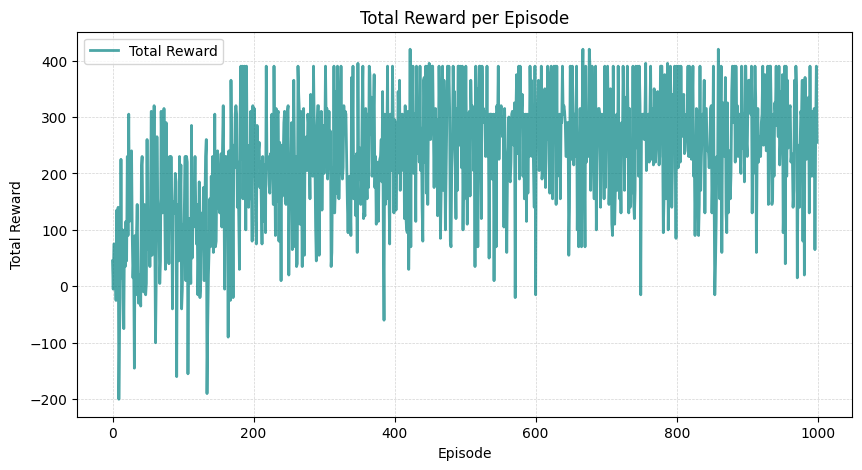

In [38]:
plt.figure(figsize=(10, 5))
plt.plot(rewards_epi, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Total Reward')
plt.title('Total Reward per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')
plt.legend(loc='upper left')
plt.show()

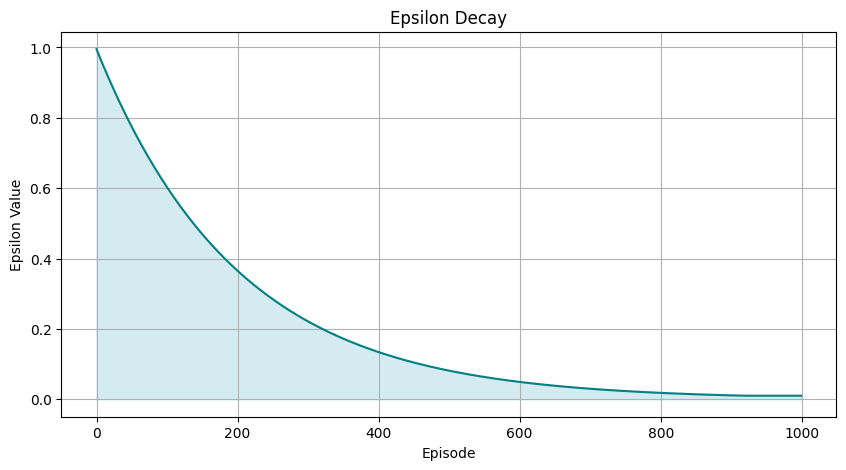

In [39]:

plt.figure(figsize=(10, 5))
plt.plot(epsilon_values, color='Teal', label='Decay')
plt.title('Epsilon Decay')
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.fill_between(range(len(epsilon_values)), epsilon_values, color="lightblue", alpha=0.5)
plt.grid(True)
plt.show()

Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 2
Requested Action: 1, Chosen Action: 3
Requested Action: 3, Chosen Action: 3
Requested Action: 2, Chosen Action: 2
Requested Action: 3, Chosen Action: 2
Requested Action: 1, Chosen Action: 0
Requested Action: 1, Chosen Action: 1
Requested Action: 2, Chosen Action: 1
Requested Action: 2, Chosen Action: 2
Requested Action: 0, Chosen Action: 1
Requested Action: 0, Chosen Action: 0
Requested Action: 2, Chosen Action: 0
Requested Action: 1, Chosen Action: 2
Requested Ac

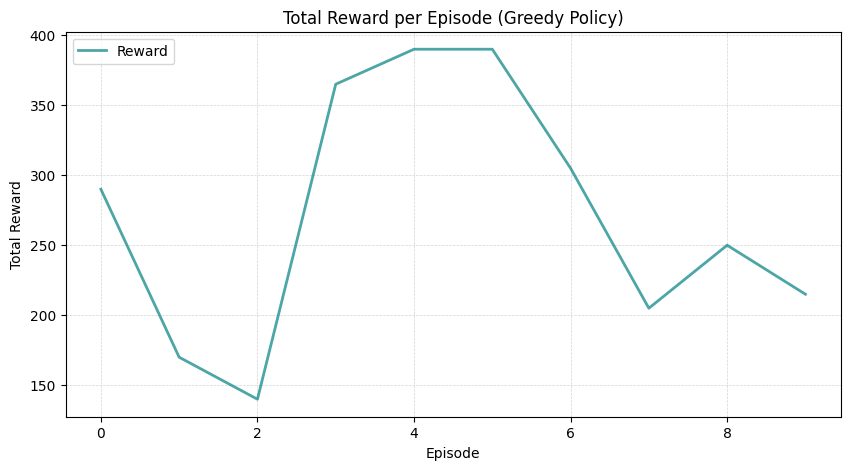

In [40]:
greedy_rewards = []
for _ in range(10):
    state, _ = env.reset()
    state_index = env.obs_space_to_index(state)
    total_greedy_rewards = 0
    while True:
        action = np.argmax((qt1[state_index] + qt2[state_index]) / 2)
        next_state, reward, terminated, truncated, _ = env.step(action)
        state_index = env.obs_space_to_index(next_state)
        total_greedy_rewards += reward

        if terminated or truncated:
            break

    greedy_rewards.append(total_greedy_rewards)


plt.figure(figsize=(10, 5))
plt.plot(greedy_rewards, color='Teal', linestyle='-', linewidth=2, alpha=0.7, label='Reward')
plt.title('Total Reward per Episode (Greedy Policy)')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray')
plt.legend(loc='upper left')
plt.show()